# Frame Clustering Demo

## Set-up

### Load modules

In [3]:
import os # module for interacting with files and folders
from audio_processing import *
from audio_display import *
from feature_normalize import *
from array_manipulation import *
from pca_paths import *
from frame_clustering import *
from segments import *

### Load Audio Files

In [14]:
from load_audio import *

paths = [r'sound/American-English/Narrative',
        r'sound/American-English/Consonants',
        r'sound/American-English/Vowels',
        r'sound/Non-speech']

out_path = 'sound/out/'

fns,audio_data = load_audio(paths_list=paths, pad=0, bdw=1,nonspeech_dur=0)

narrative_fns,consonants_fns,vowels_fns,nonspeech_fns = fns
narrative_data,consonants_data,vowels_data,nonspeech_data = audio_data



/Users/luntzlara/opt/anaconda3/lib/python3.9/site-packages/librosa/feature/spectral.py:2041: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  mel_basis = filters.mel(sr=sr, n_fft=n_fft, **kwargs)


### Normalization from Narrative Data

In [5]:
narr = get_narr(narrative_fns,pad=0)
narr_scaler = get_scaler(narrative_fns)

mfcc_data = np.transpose(norm_array_hor(narr,narr_scaler))
print(mfcc_data.shape)

narr_pca = PCA(n_components=3).fit(mfcc_data)
mfccs_pca = narr_pca.transform(mfcc_data)
print(f'Explained variance ratio: \n{narr_pca.explained_variance_ratio_}')

(9549, 12)
Explained variance ratio: 
[0.27587187 0.1763356  0.154779  ]


In [6]:
clip_dict = {}
path_test_fns = vowels_fns+consonants_fns+nonspeech_fns
for clip_fn in path_test_fns:
  name = clip_fn.split("/")[-1].split(".")[0].title()
  clip_data = process_audio(clip_fn,n_mfcc_list=[12],pad = 0)
  fourier = clip_data["fourier"]
  sr = clip_data["sr"]
  normed_mfcc = norm_array_hor(clip_data["mfcc"]["12"],narr_scaler)
  clip_frames = np.transpose(normed_mfcc)
  clip_pca = narr_pca.transform(clip_frames)
  clip_dict[name] = {"frames":clip_frames,"pca":clip_pca}

print(clip_dict.keys())
print(clip_dict["Bird"].keys())
print(clip_dict["Bird"]['frames'].shape)
print(clip_dict["Bird"]['pca'].shape)

dict_keys(['Bird', 'Bed', 'Bid', 'Above', 'Bayed', 'Good', 'Buy', 'Bud', 'Bead', 'Bough', 'Bad', 'Boy', 'Booed', 'Bode', 'Pod', 'Sigh', 'Shy', 'Fie', 'Rye', 'Die', 'Why', 'Hang', 'Guy', 'Thigh', 'You', 'Thy', 'Gin', 'Vie', 'My', 'Azure', 'Tie', 'High', 'Pie', 'Kite', 'Chin', 'Lie', 'Nigh', 'Zoo', 'Train', 'Water'])
dict_keys(['frames', 'pca'])
(202, 12)
(202, 3)


### Visualize Narrative Data

Text(0.5, 1.0, 'Isometric')

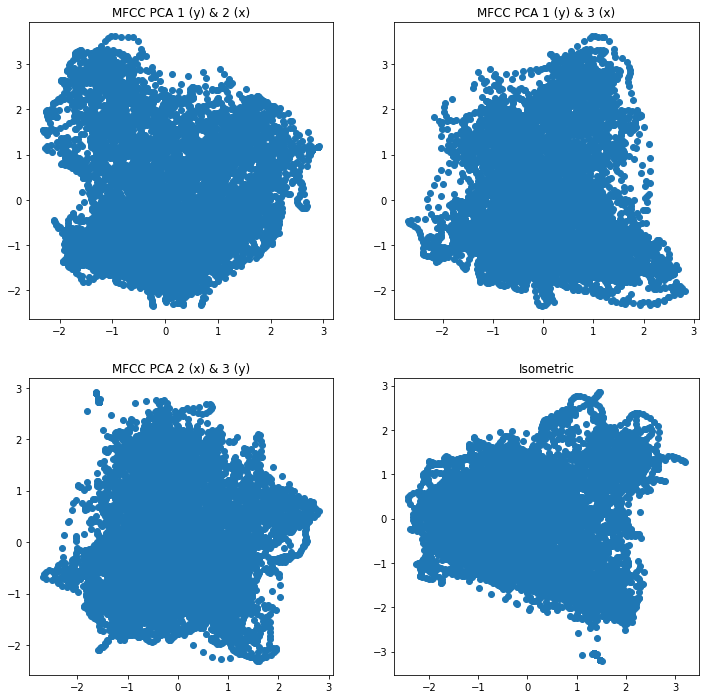

In [7]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

fig, axs = plt.subplots(nrows=2,ncols=2,figsize=(12, 12))

axs[0,0].scatter(mfccs_pca[:, 1], mfccs_pca[:, 0])
axs[0,0].set_title("MFCC PCA 1 (y) & 2 (x)")

axs[0,1].scatter(mfccs_pca[:, 2], mfccs_pca[:, 0])
axs[0,1].set_title("MFCC PCA 1 (y) & 3 (x)")

axs[1,0].scatter(mfccs_pca[:, 2], mfccs_pca[:, 1])
axs[1,0].set_title("MFCC PCA 2 (x) & 3 (y)")

axs[1,1].scatter(0.408*(2*mfccs_pca[:, 0]+mfccs_pca[:, 1]+mfccs_pca[:, 2]), 0.707*(mfccs_pca[:, 2]-mfccs_pca[:, 1]))
axs[1,1].set_title("Isometric")

## K-Means Clustering Test on Audio Sequence Data

### n-Cluster Selection Using Silhouette Scores

For n_clusters = 2 The average silhouette_score is : 0.20988116
For n_clusters = 3 The average silhouette_score is : 0.19859263
For n_clusters = 4 The average silhouette_score is : 0.20507263
For n_clusters = 5 The average silhouette_score is : 0.19147012
For n_clusters = 6 The average silhouette_score is : 0.1930831
For n_clusters = 7 The average silhouette_score is : 0.18924667
For n_clusters = 8 The average silhouette_score is : 0.17836292
For n_clusters = 9 The average silhouette_score is : 0.1708283
For n_clusters = 10 The average silhouette_score is : 0.16789648


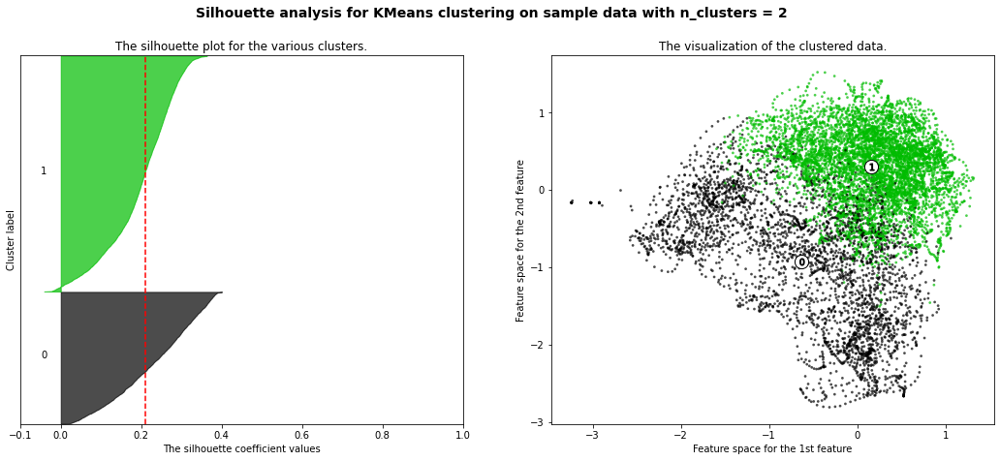

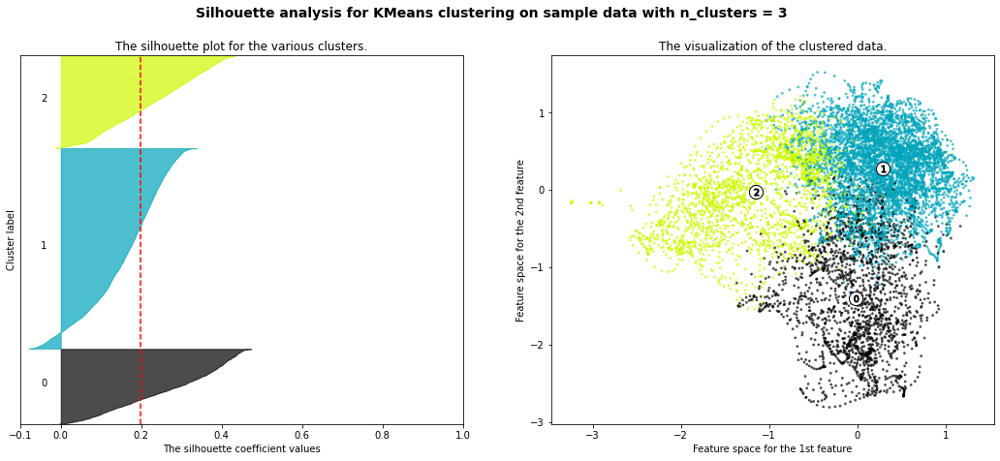

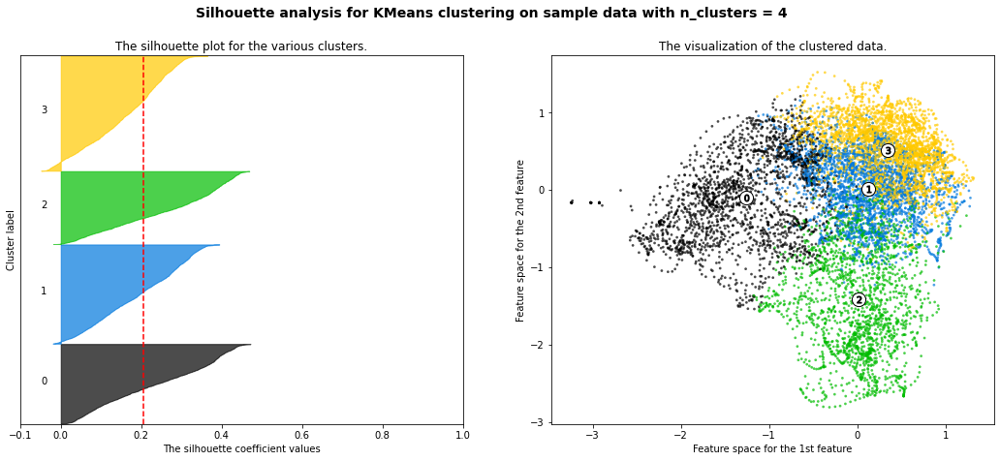

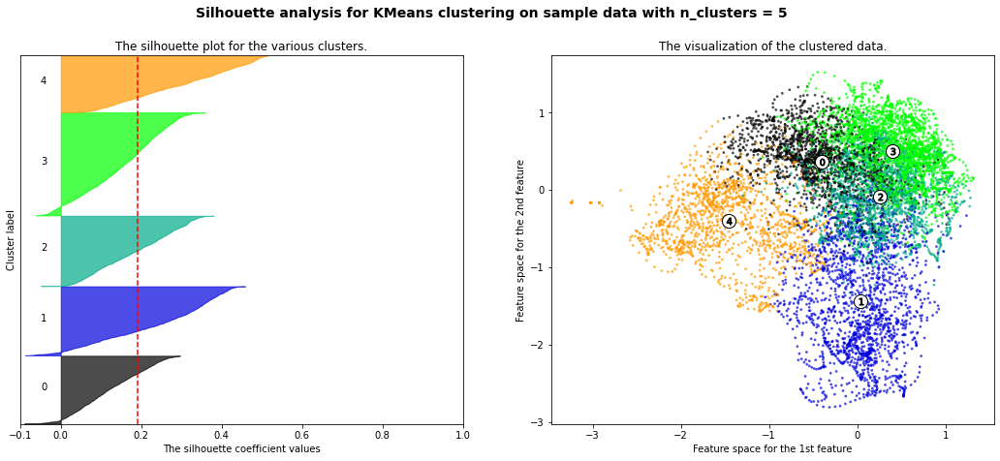

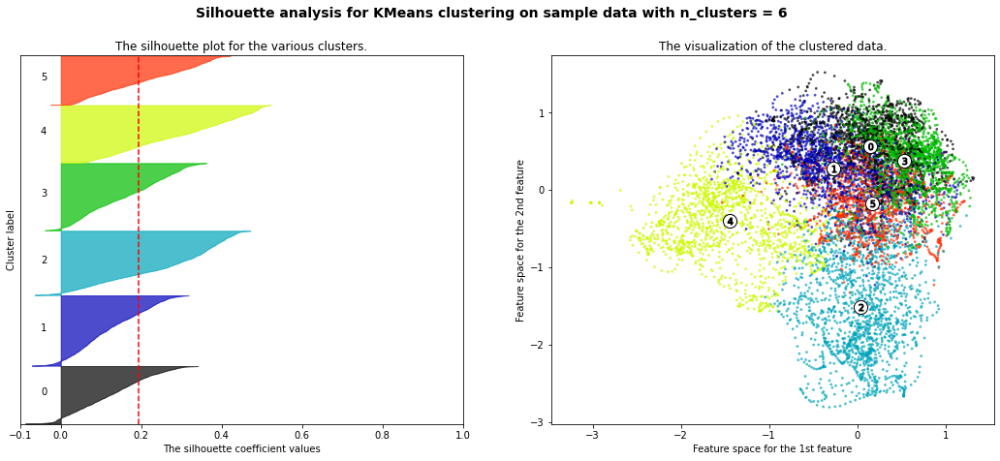

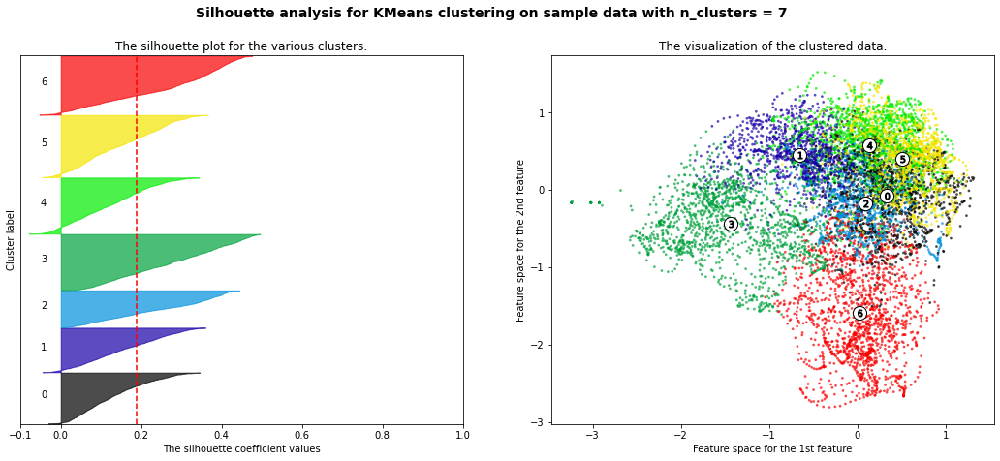

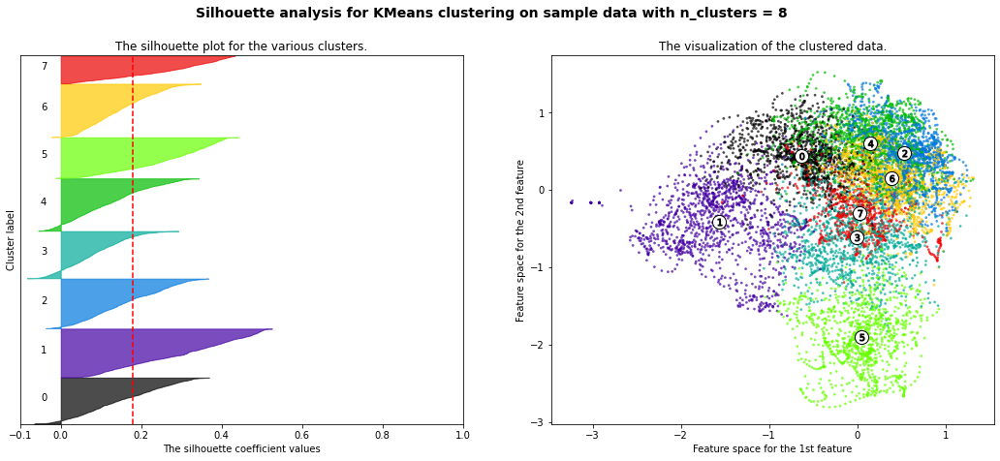

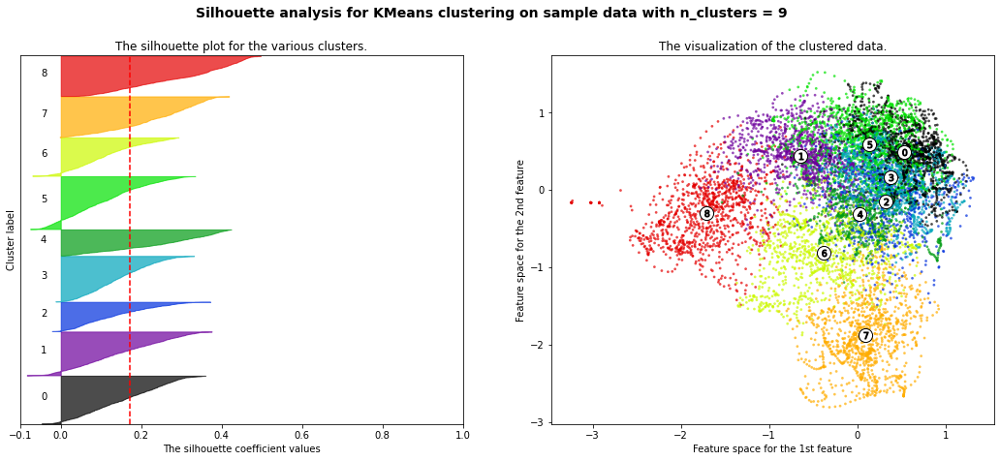

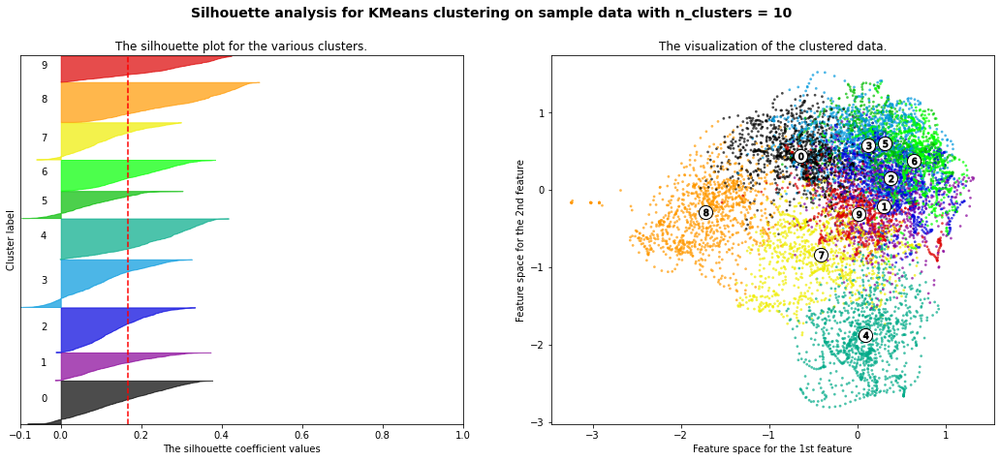

In [8]:
# Generating the sample data from make_blobs
# This particular setting has one distinct cluster and 3 clusters placed close
# together.
X = mfcc_data

random_state = 170

common_params = {
    "n_init": 10,
    "random_state": random_state,
}

range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, **common_params)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        X[:, 0], X[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

### Fit model

In [9]:
random_state = 170

common_params = {
    "n_init": 10,
    "random_state": random_state,
}

kmeans_clusters = KMeans(n_clusters=4, **common_params).fit(mfcc_data)

### Plot Results

Training: Clusters on Narrative

Text(0.5, 1.0, 'Isometric')

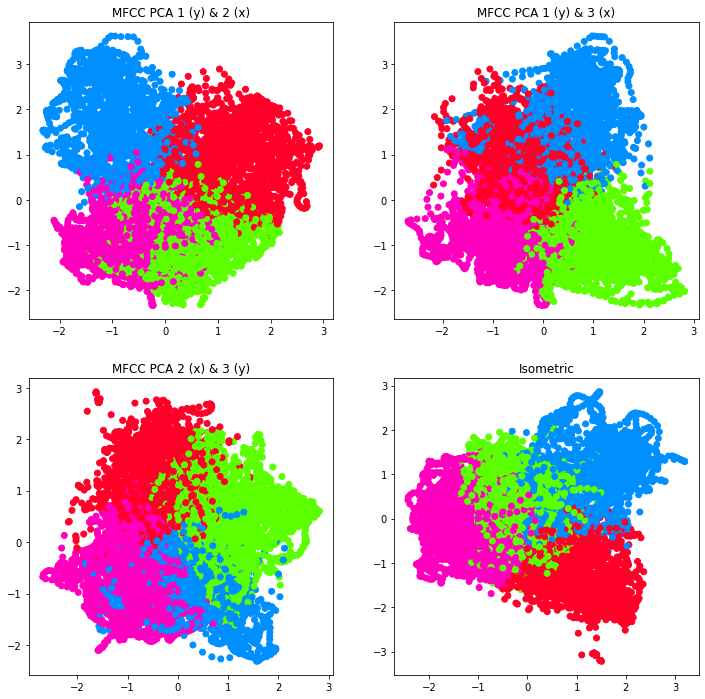

In [10]:
y_pred = kmeans_clusters.predict(mfcc_data)

fig, axs = plt.subplots(nrows=2,ncols=2,figsize=(12, 12))
colors = 'gist_rainbow'

axs[0,0].scatter(mfccs_pca[:, 1], mfccs_pca[:, 0], c=y_pred, cmap = colors)
axs[0,0].set_title("MFCC PCA 1 (y) & 2 (x)")

axs[0,1].scatter(mfccs_pca[:, 2], mfccs_pca[:, 0], c=y_pred, cmap = colors)
axs[0,1].set_title("MFCC PCA 1 (y) & 3 (x)")

axs[1,0].scatter(mfccs_pca[:, 2], mfccs_pca[:, 1], c=y_pred, cmap = colors)
axs[1,0].set_title("MFCC PCA 2 (x) & 3 (y)")

axs[1,1].scatter(0.408*(2*mfccs_pca[:, 0]+mfccs_pca[:, 1]+mfccs_pca[:, 2]), 0.707*(mfccs_pca[:, 2]-mfccs_pca[:, 1]), c=y_pred, cmap = colors)
axs[1,1].set_title("Isometric")

Test: Clusters on Single Words

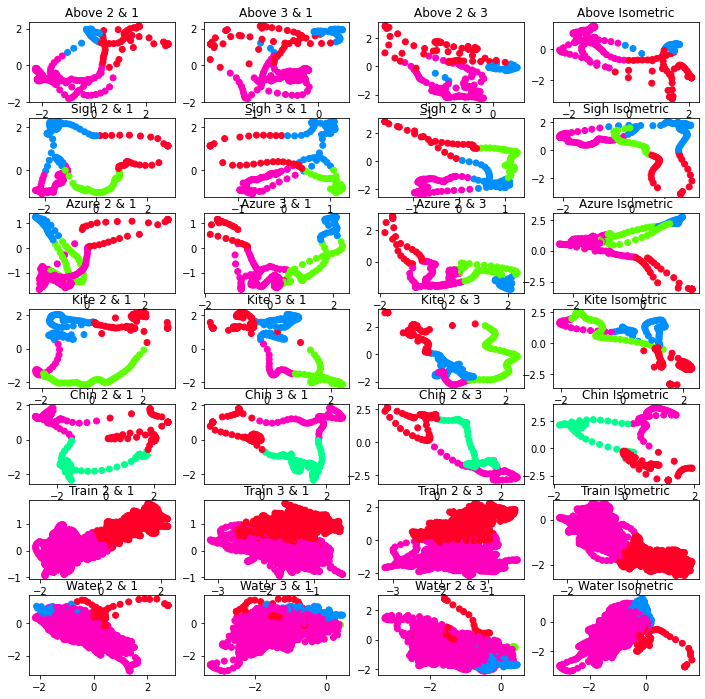

In [11]:
fig, axs = plt.subplots(nrows=7, ncols=4, figsize=(12, 12))

for i,word in enumerate(['Above', 'Sigh', 'Azure', 'Kite', 'Chin', 'Train', 'Water']):

    clip = clip_dict[word]
    X,X_pca = clip["frames"],clip["pca"]
    y_pred = kmeans_clusters.predict(X)

    axs[i,0].scatter(X_pca[:, 1], X_pca[:, 0], c=y_pred, cmap = colors)
    axs[i,0].set_title(f"{word} 2 & 1")

    axs[i,1].scatter(X_pca[:, 2], X_pca[:, 0], c=y_pred, cmap = colors)
    axs[i,1].set_title(f"{word} 3 & 1")

    axs[i,2].scatter(X_pca[:, 2], X_pca[:, 1], c=y_pred, cmap = colors)
    axs[i,2].set_title(f"{word} 2 & 3")

    axs[i,3].scatter(0.408*(2*X_pca[:, 0]+X_pca[:, 1]+X_pca[:, 2]), 0.707*(X_pca[:, 2]-X_pca[:, 1]), c=y_pred, cmap = colors)
    axs[i,3].set_title(f"{word} Isometric")

Showing results on spectrogram

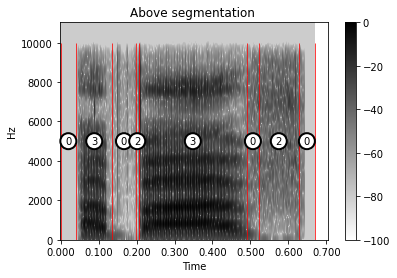

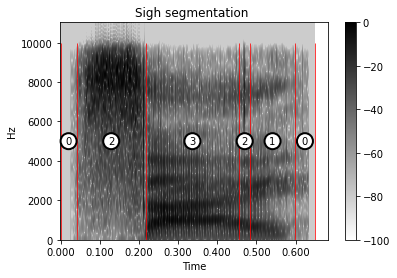

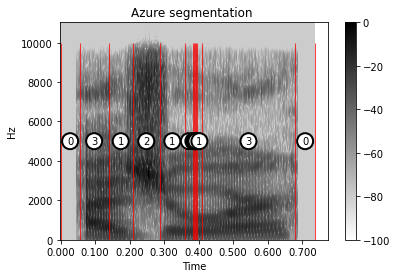

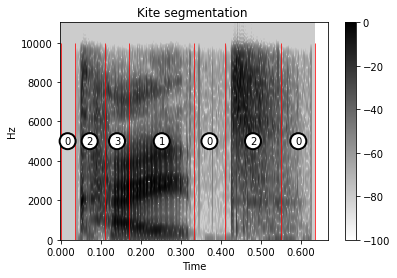

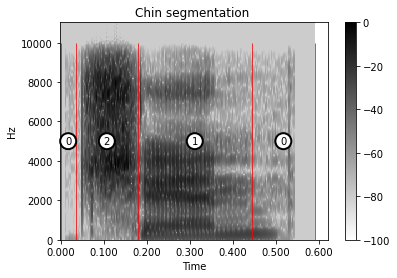

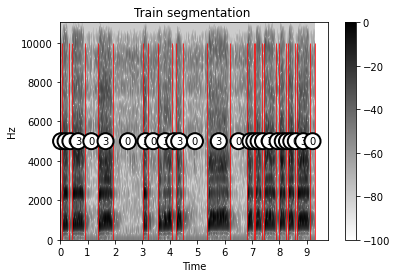

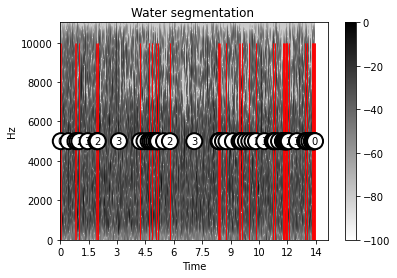

In [16]:
data = [item for sublist in audio_data for item in sublist]

res = 3
sr = sr
hop = 2**(9-res)
w = hop/sr

for word in ['Above', 'Sigh', 'Azure', 'Kite', 'Chin', 'Train', 'Water']:
    clip = clip_dict[word]
    X,X_pca = clip["frames"],clip["pca"]
    y_pred = kmeans_clusters.predict(X)
    clustering = list(y_pred)
    segmentation = get_intervals(clustering,frame_w=w)

    word_data = next(item for item in data if item["fn"].split("/")[-1].split(".")[0].title() == word)
    #plot_timeseries_on_spectrogram(word_data["fourier"],y_pred,sr,scale_ts=1,title=word,line_color='red')
    #plot_segments_on_mfcc(np.transpose(clip_dict[word]['frames']),segmentation,sr,title=f"{word} segmentation ",line_color='black')
    plot_segments_on_spectrogram(word_data["fourier"],segmentation,sr,title=f"{word} segmentation ",line_color='red')

## Hierarchical Clustering Test on Audio Sequence Data

### Clustering on Narrative

#### n-Cluster Selection Using Silhouette Scores

For n_clusters = 2 The average silhouette_score is : 0.15548468
For n_clusters = 3 The average silhouette_score is : 0.13987724
For n_clusters = 4 The average silhouette_score is : 0.13657032
For n_clusters = 5 The average silhouette_score is : 0.12629692
For n_clusters = 6 The average silhouette_score is : 0.12705639
For n_clusters = 7 The average silhouette_score is : 0.12880427
For n_clusters = 8 The average silhouette_score is : 0.1181004
For n_clusters = 9 The average silhouette_score is : 0.12164793
For n_clusters = 10 The average silhouette_score is : 0.12827806


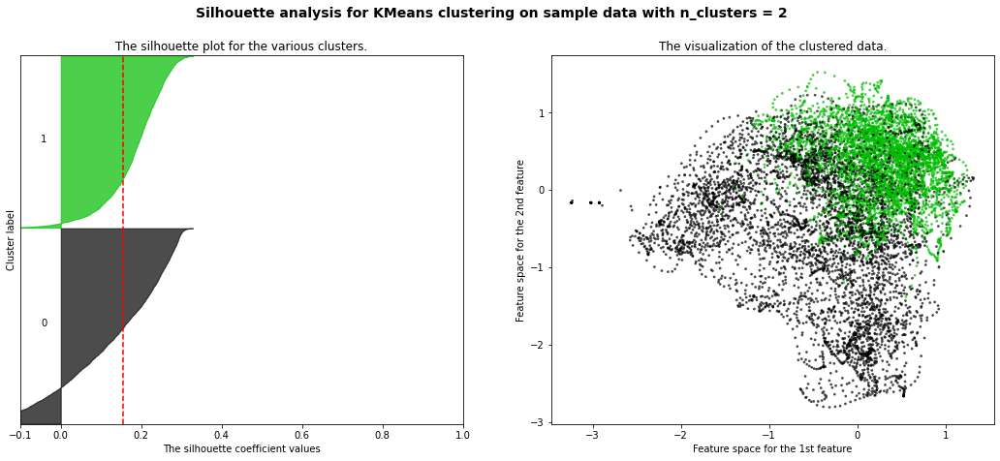

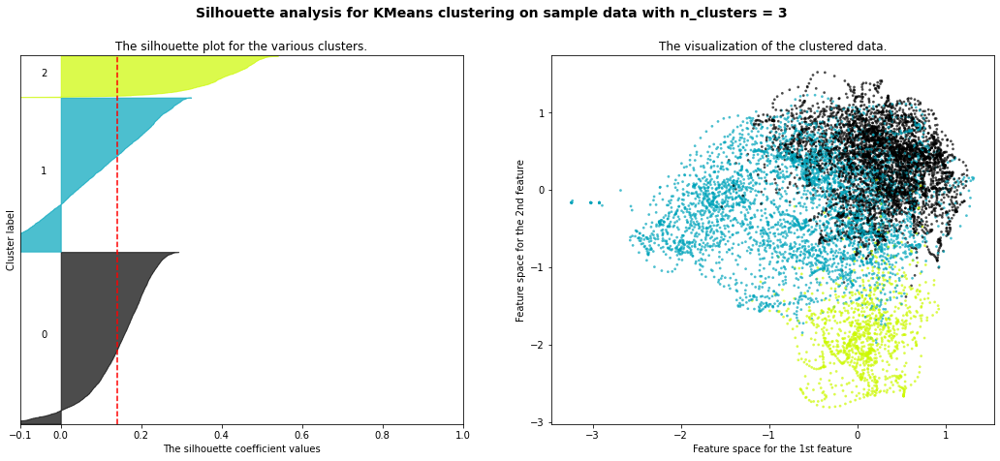

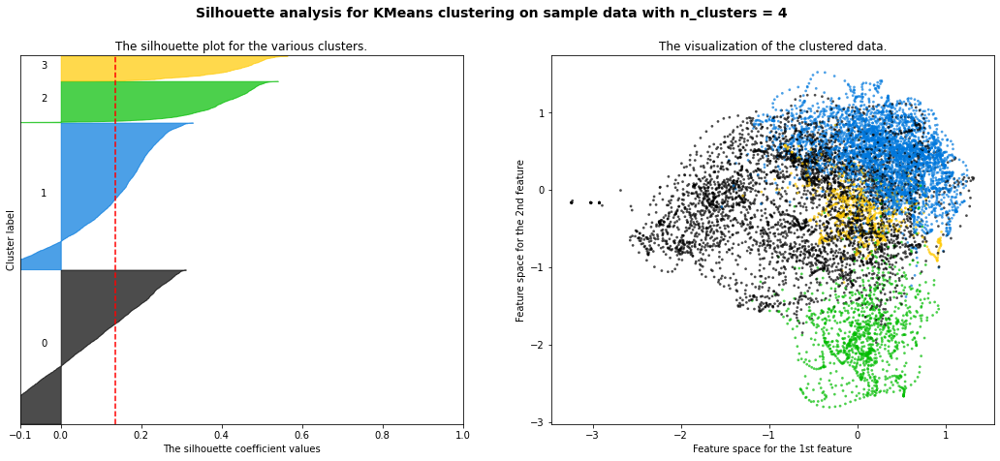

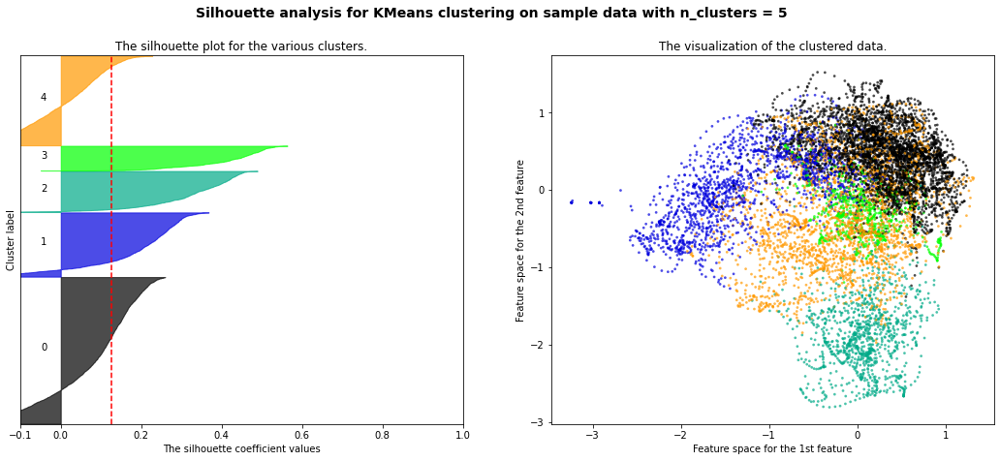

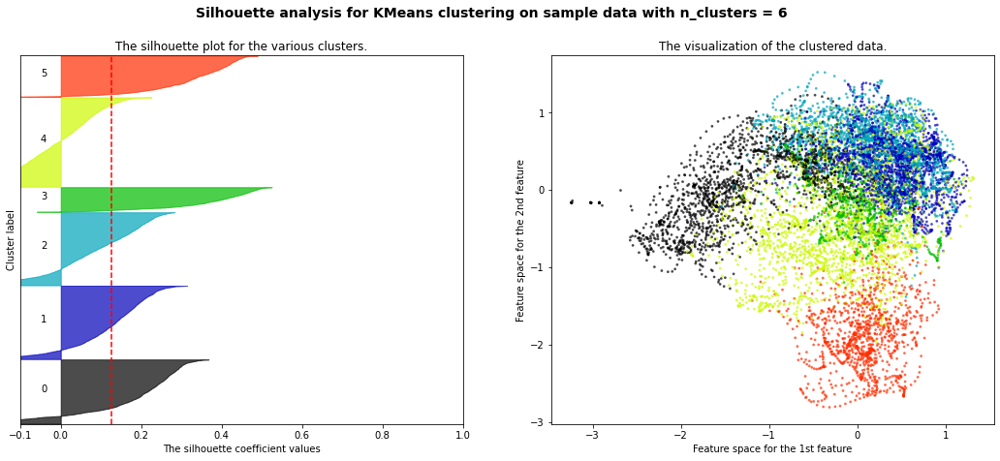

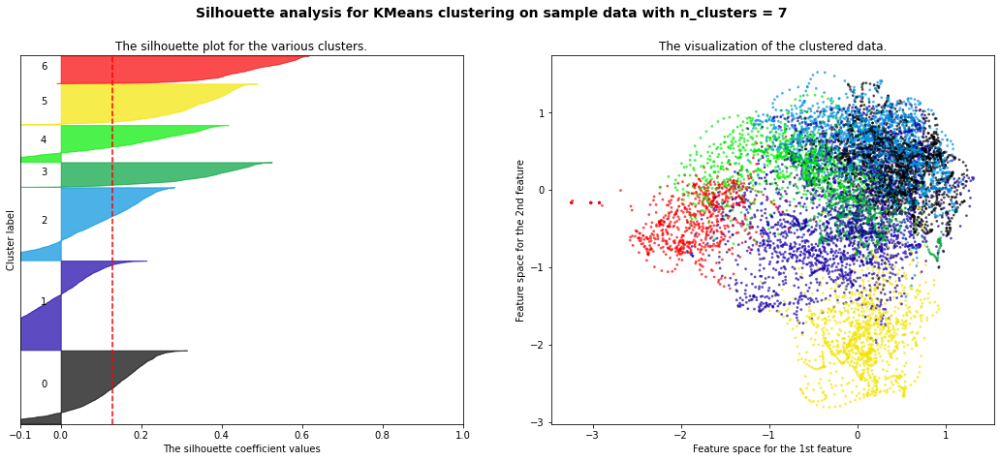

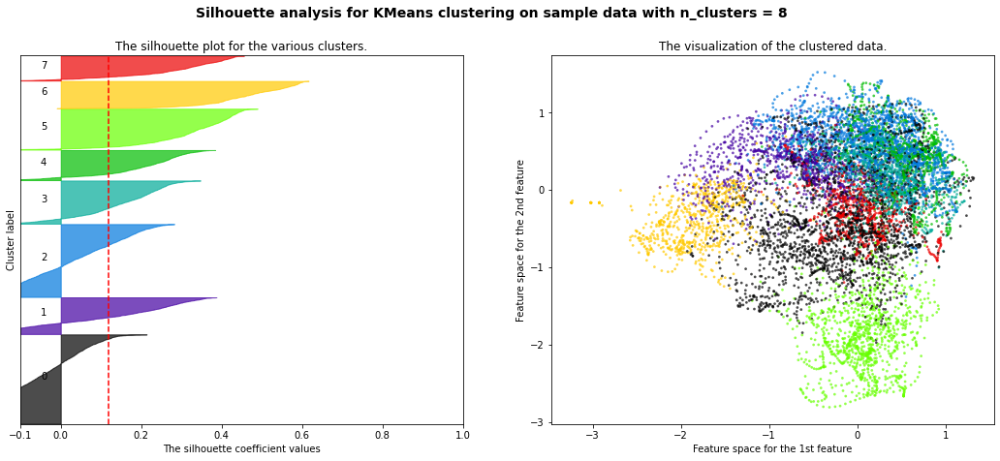

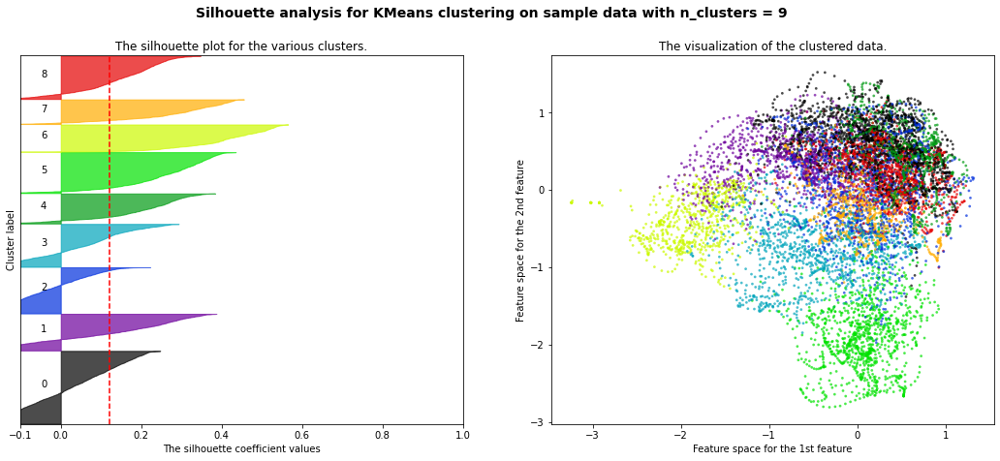

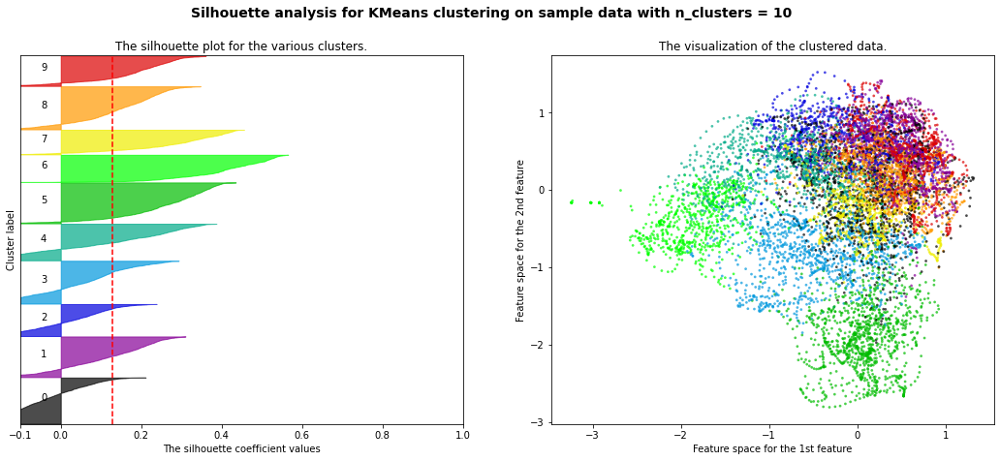

In [11]:
# Generating the sample data from make_blobs
# This particular setting has one distinct cluster and 3 clusters placed close
# together.
X = mfcc_data

range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = AgglomerativeClustering(linkage = "ward",n_clusters=n_clusters)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        X[:, 0], X[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    #centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    #ax2.scatter(
    #    centers[:, 0],
    #    centers[:, 1],
    #    marker="o",
    #    c="white",
    #    alpha=1,
    #    s=200,
    #    edgecolor="k",
    #)

    #for i, c in enumerate(centers):
    #    ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

#### Fit model

In [12]:
common_params = {
    "connectivity": None,
    "compute_full_tree": True,
    "n_clusters": None
}

agg_clusters = AgglomerativeClustering(linkage = "ward",distance_threshold = 750, **common_params)

y_pred = agg_clusters.fit_predict(mfcc_data)

#### Plot Results

Text(0.5, 1.0, 'Isometric')

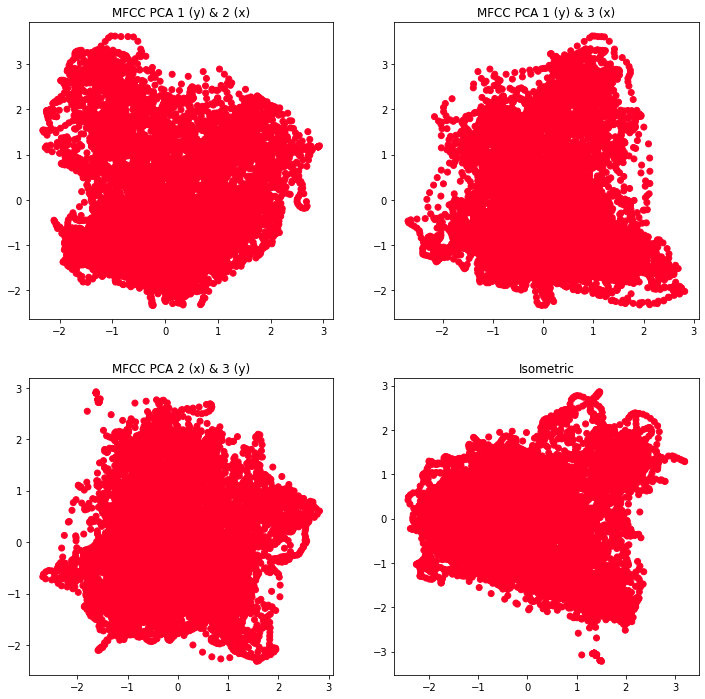

In [13]:
fig, axs = plt.subplots(nrows=2,ncols=2,figsize=(12, 12))
colors = 'gist_rainbow'

axs[0,0].scatter(mfccs_pca[:, 1], mfccs_pca[:, 0], c=y_pred, cmap = colors)
axs[0,0].set_title("MFCC PCA 1 (y) & 2 (x)")

axs[0,1].scatter(mfccs_pca[:, 2], mfccs_pca[:, 0], c=y_pred, cmap = colors)
axs[0,1].set_title("MFCC PCA 1 (y) & 3 (x)")

axs[1,0].scatter(mfccs_pca[:, 2], mfccs_pca[:, 1], c=y_pred, cmap = colors)
axs[1,0].set_title("MFCC PCA 2 (x) & 3 (y)")

axs[1,1].scatter(0.408*(2*mfccs_pca[:, 0]+mfccs_pca[:, 1]+mfccs_pca[:, 2]), 0.707*(mfccs_pca[:, 2]-mfccs_pca[:, 1]), c=y_pred, cmap = colors)
axs[1,1].set_title("Isometric")

#### Visualize Clusters With Dendogram

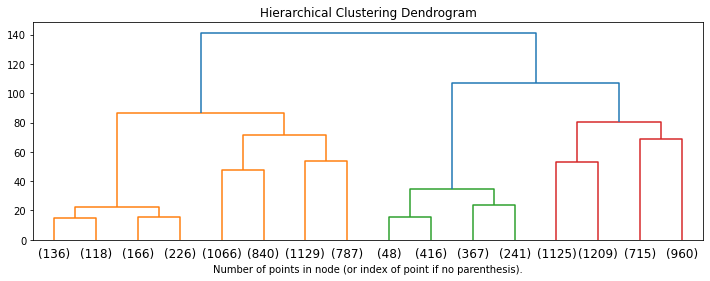

In [14]:
plt.figure(figsize=(12,4))
plt.title("Hierarchical Clustering Dendrogram")
# plot the top three levels of the dendrogram
plot_dendrogram(agg_clusters, truncate_mode="level", p=3)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

### Clustering on Single Words

In [15]:
print(list(clip_dict.keys()))

['Bird', 'Bed', 'Bid', 'Above', 'Bayed', 'Good', 'Buy', 'Bud', 'Bead', 'Bough', 'Bad', 'Boy', 'Booed', 'Bode', 'Pod', 'Sigh', 'Shy', 'Fie', 'Rye', 'Die', 'Why', 'Hang', 'Guy', 'Thigh', 'You', 'Thy', 'Gin', 'Vie', 'My', 'Azure', 'Tie', 'High', 'Pie', 'Kite', 'Chin', 'Lie', 'Nigh', 'Zoo', 'Train', 'Water']


#### Comparison of linkage methods

/Users/luntzlara/Library/CloudStorage/OneDrive-UBC/Grad_School/QP1/Acoustic Segments/audio_display.py:56: RuntimeWarning: invalid value encountered in true_divide
  ax.plot(times, data*scale_ts*10000/data_max, color=line_color)


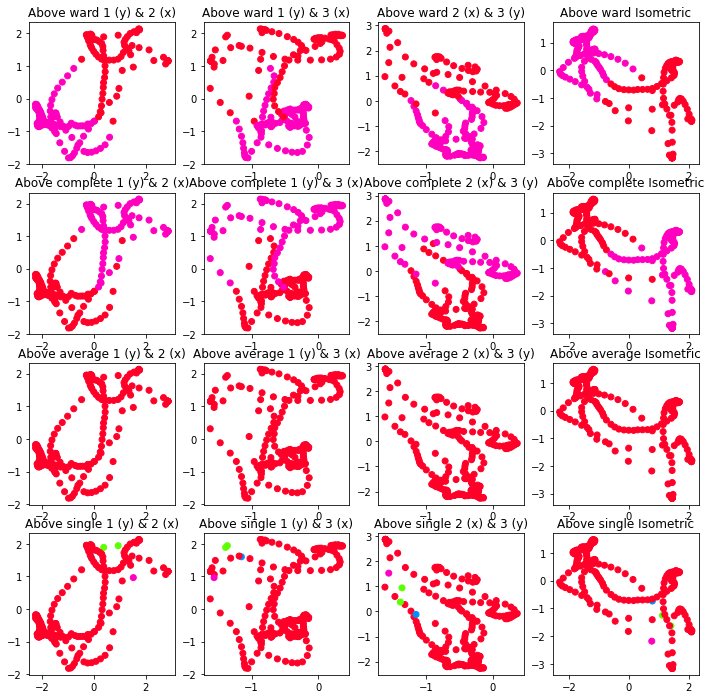

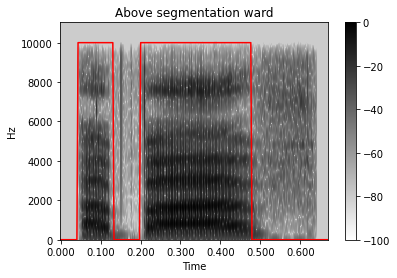

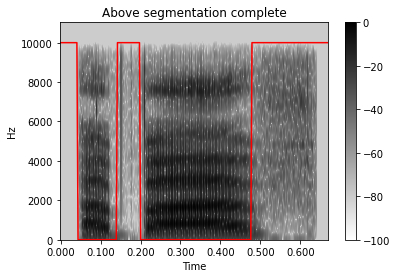

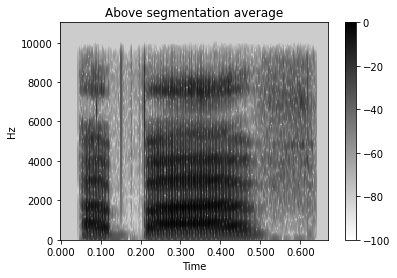

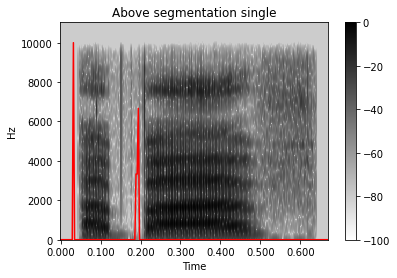

In [16]:
word = "Above"

data = [item for sublist in audio_data for item in sublist]
clip = clip_dict[word]
X,X_pca = clip["frames"],clip["pca"]
word_data = next(item for item in data if item["fn"].split("/")[-1].split(".")[0].title() == word)

common_params = {
    "connectivity": None,
    "compute_full_tree": True,
    "n_clusters": None
}

fig, axs = plt.subplots(nrows=4, ncols=4, figsize=(12, 12))

for i,t in enumerate(zip(["ward","complete","average","single"],[20,6,4,1])):
    linkage,distance_threshold = t
    agg_clusters_clip = AgglomerativeClustering(linkage = linkage, distance_threshold = distance_threshold, **common_params)
    y_pred = agg_clusters_clip.fit_predict(X)
    axs[i,0].scatter(X_pca[:, 1], X_pca[:, 0], c=y_pred, cmap = colors)
    axs[i,0].set_title(f"{word} {linkage} 1 (y) & 2 (x)")

    axs[i,1].scatter(X_pca[:, 2], X_pca[:, 0], c=y_pred, cmap = colors)
    axs[i,1].set_title(f"{word} {linkage} 1 (y) & 3 (x)")

    axs[i,2].scatter(X_pca[:, 2], X_pca[:, 1], c=y_pred, cmap = colors)
    axs[i,2].set_title(f"{word} {linkage} 2 (x) & 3 (y)")

    axs[i,3].scatter(0.408*(2*X_pca[:, 0]+X_pca[:, 1]+X_pca[:, 2]), 0.707*(X_pca[:, 2]-X_pca[:, 1]), c=y_pred, cmap = colors)
    axs[i,3].set_title(f"{word} {linkage} Isometric")

    plot_timeseries_on_spectrogram(word_data["fourier"],y_pred,sr,scale_ts=1,title=f"{word} segmentation {linkage}",line_color='red')

    


#### Segmenting with Different Linkages

##### Ward Linkage
Minimizes the variance of the clusters being merged.

/Users/luntzlara/Library/CloudStorage/OneDrive-UBC/Grad_School/QP1/Acoustic Segments/audio_display.py:50: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()
/Users/luntzlara/Library/CloudStorage/OneDrive-UBC/Grad_School/QP1/Acoustic Segments/audio_display.py:56: RuntimeWarning: invalid value encountered in true_divide
  ax.plot(times, data*scale_ts*10000/data_max, color=line_color)
/Users/luntzlara/Library/CloudStorage/OneDrive-UBC/Grad_School/QP1/Acoustic Segments/audio_display.py:69: RuntimeWarning: invalid value encountered in true_divide
  ax.plot(times, data*scale_ts*10000/data_max, color=line_color)


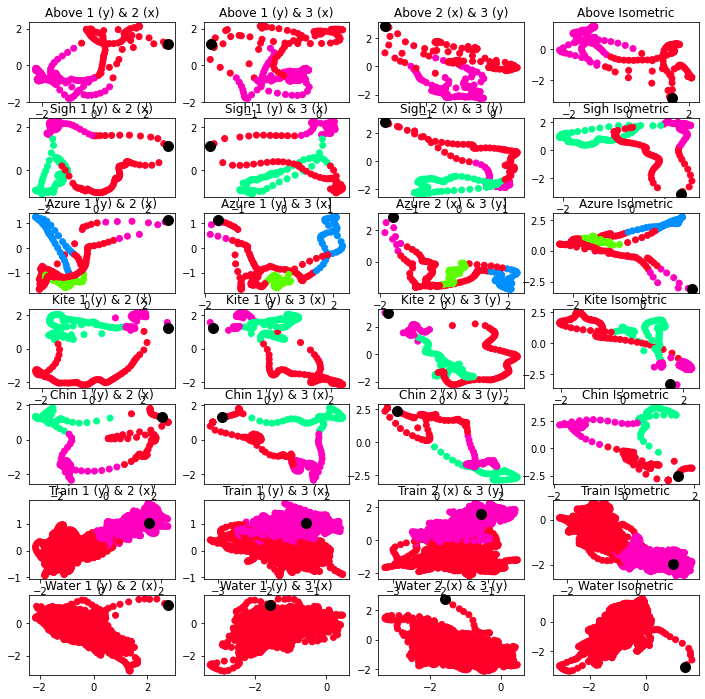

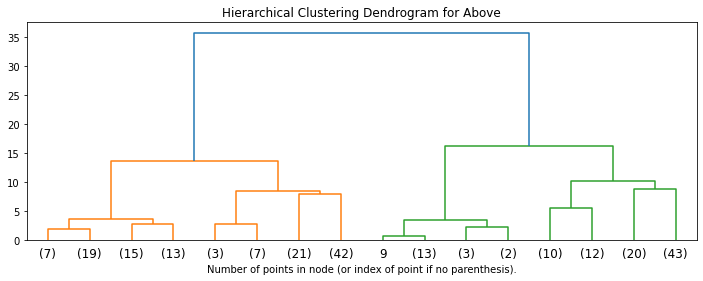

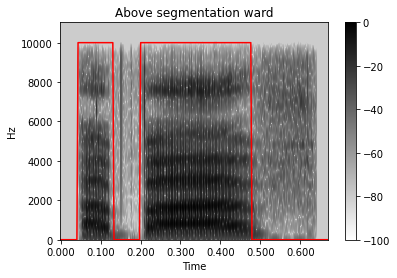

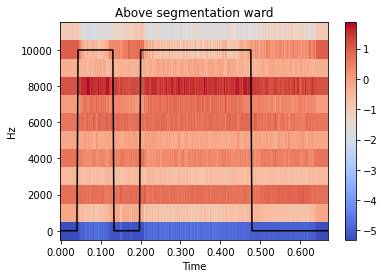

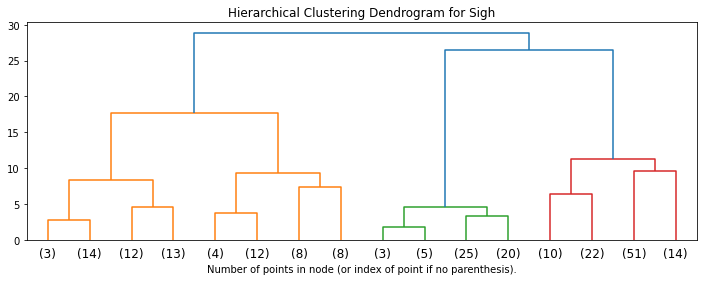

...

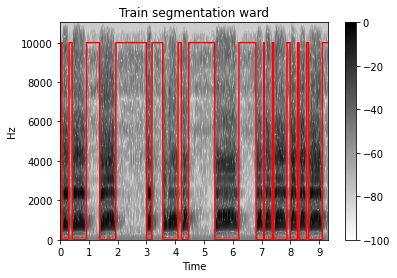

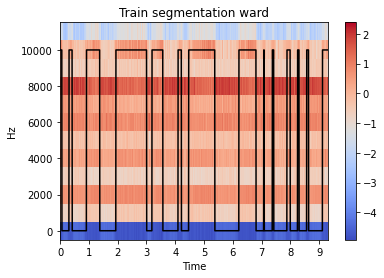

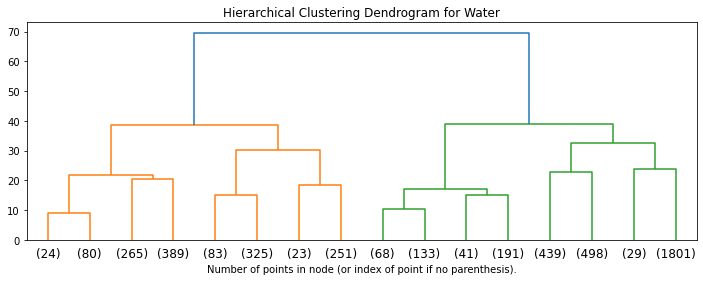

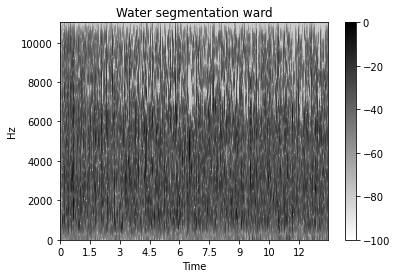

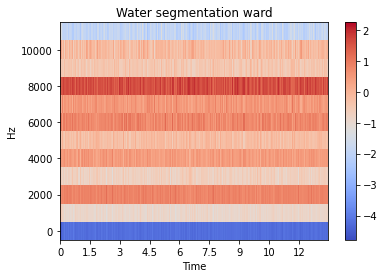

In [17]:
linkage = 'ward'
distance_threshold = 20

colors = 'gist_rainbow'

data = [item for sublist in audio_data for item in sublist]

fig, axs = plt.subplots(nrows=7, ncols=4, figsize=(12, 12))

plt_dict = {}

for i,word in enumerate(['Above', 'Sigh', 'Azure', 'Kite', 'Chin', 'Train', 'Water']):
    clip = clip_dict[word]
    X,X_pca = clip["frames"],clip["pca"]

    word_data = next(item for item in data if item["fn"].split("/")[-1].split(".")[0].title() == word)

    
    if word in ["Train","Water"]:
        distance_threshold = 100

    agg_clusters_clip = AgglomerativeClustering(linkage = linkage, distance_threshold = distance_threshold, **common_params)

    y_pred = agg_clusters_clip.fit_predict(X)
    axs[i,0].scatter(X_pca[:, 1], X_pca[:, 0], c=y_pred, cmap = colors)
    axs[i,0].set_title(f"{word} 1 (y) & 2 (x)")
    axs[i,0].plot(X_pca[:, 1], X_pca[:, 0], 'o', ls='', ms=10, markevery=[0], color='black')

    axs[i,1].scatter(X_pca[:, 2], X_pca[:, 0], c=y_pred, cmap = colors)
    axs[i,1].set_title(f"{word} 1 (y) & 3 (x)")
    axs[i,1].plot(X_pca[:, 2], X_pca[:, 0], 'o', ls='', ms=10, markevery=[0], color='black')

    axs[i,2].scatter(X_pca[:, 2], X_pca[:, 1], c=y_pred, cmap = colors)
    axs[i,2].set_title(f"{word} 2 (x) & 3 (y)")
    axs[i,2].plot(X_pca[:, 2], X_pca[:, 1], 'o', ls='', ms=10, markevery=[0], color='black')

    axs[i,3].scatter(0.408*(2*X_pca[:, 0]+X_pca[:, 1]+X_pca[:, 2]), 0.707*(X_pca[:, 2]-X_pca[:, 1]), c=y_pred, cmap = colors)
    axs[i,3].set_title(f"{word} Isometric")
    axs[i,3].plot(0.408*(2*X_pca[:, 0]+X_pca[:, 1]+X_pca[:, 2]), 0.707*(X_pca[:, 2]-X_pca[:, 1]), 'o', ls='', ms=10, markevery=[0], color='black')

    plt.figure(figsize=(12,4))
    plt.title(f"Hierarchical Clustering Dendrogram for {word}")
    # plot the top three levels of the dendrogram
    plot_dendrogram(agg_clusters_clip, truncate_mode="level",p=3)
    plt.xlabel("Number of points in node (or index of point if no parenthesis).")

    plot_timeseries_on_spectrogram(word_data["fourier"],y_pred,sr,scale_ts=1,title=f"{word} segmentation {linkage}",line_color='red')
    plot_timeseries_on_mfcc(norm_array_hor(word_data["mfcc"]["12"],narr_scaler),y_pred,sr,scale_ts=1,title=f"{word} segmentation {linkage}",line_color='black')


##### Complete Linkage
Uses the maximum distances between all observations of the two sets.

/Users/luntzlara/Library/CloudStorage/OneDrive-UBC/Grad_School/QP1/Acoustic Segments/audio_display.py:56: RuntimeWarning: invalid value encountered in true_divide
  ax.plot(times, data*scale_ts*10000/data_max, color=line_color)
/Users/luntzlara/Library/CloudStorage/OneDrive-UBC/Grad_School/QP1/Acoustic Segments/audio_display.py:69: RuntimeWarning: invalid value encountered in true_divide
  ax.plot(times, data*scale_ts*10000/data_max, color=line_color)
/Users/luntzlara/Library/CloudStorage/OneDrive-UBC/Grad_School/QP1/Acoustic Segments/audio_display.py:56: RuntimeWarning: invalid value encountered in true_divide
  ax.plot(times, data*scale_ts*10000/data_max, color=line_color)
/Users/luntzlara/Library/CloudStorage/OneDrive-UBC/Grad_School/QP1/Acoustic Segments/audio_display.py:69: RuntimeWarning: invalid value encountered in true_divide
  ax.plot(times, data*scale_ts*10000/data_max, color=line_color)
/Users/luntzlara/Library/CloudStorage/OneDrive-UBC/Grad_School/QP1/Acoustic Segments/aud

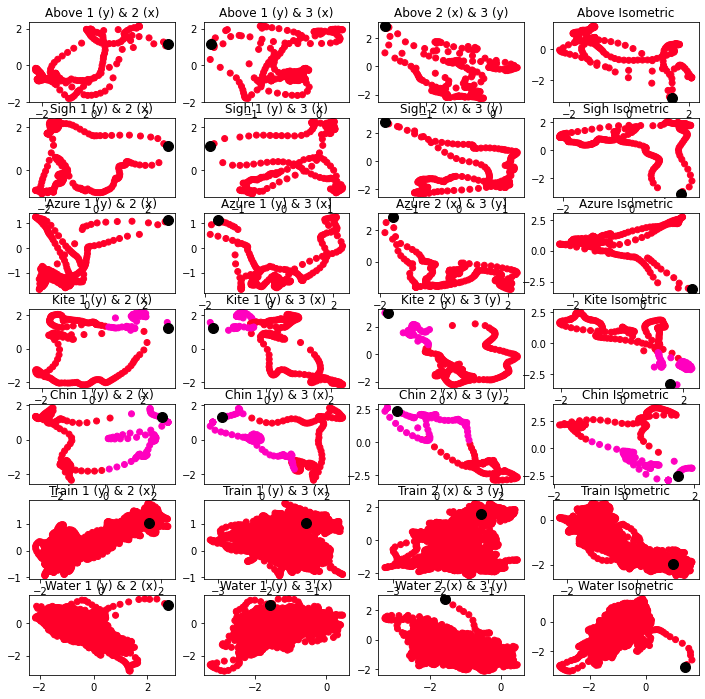

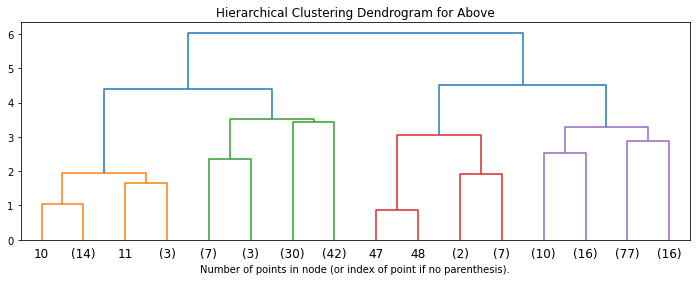

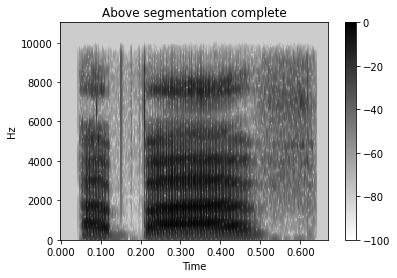

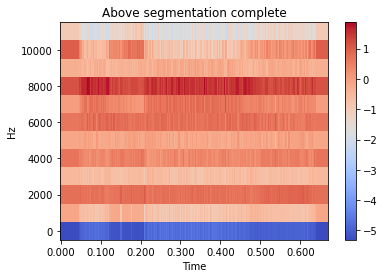

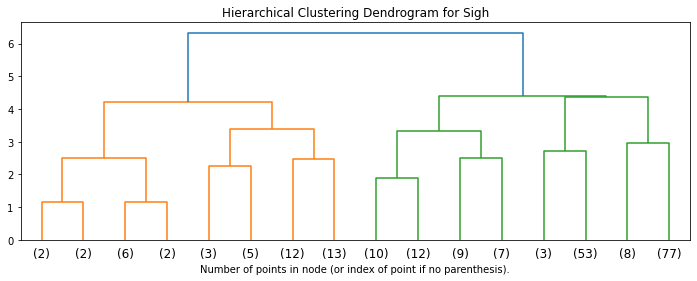

...

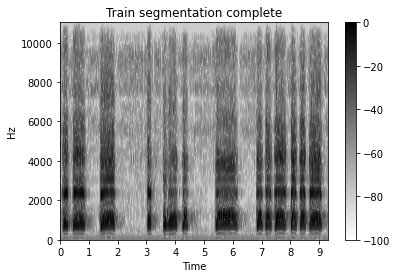

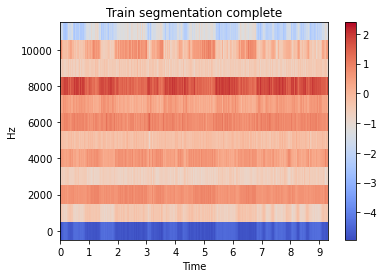

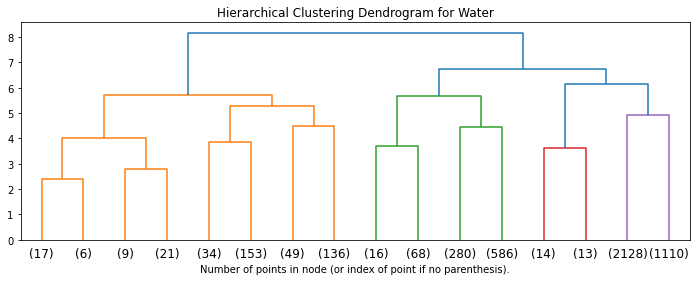

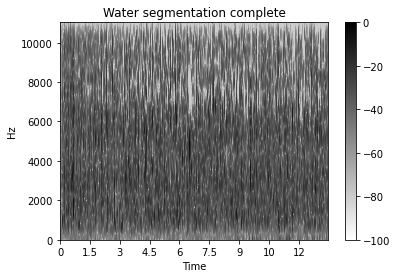

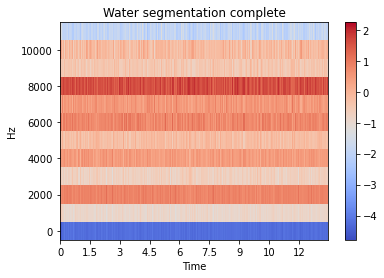

In [18]:
linkage = 'complete'
distance_threshold = 6.5

colors = 'gist_rainbow'

data = [item for sublist in audio_data for item in sublist]

fig, axs = plt.subplots(nrows=7, ncols=4, figsize=(12, 12))

plt_dict = {}

for i,word in enumerate(['Above', 'Sigh', 'Azure', 'Kite', 'Chin', 'Train', 'Water']):
    clip = clip_dict[word]
    X,X_pca = clip["frames"],clip["pca"]

    word_data = next(item for item in data if item["fn"].split("/")[-1].split(".")[0].title() == word)

    
    if word in ["Train","Water"]:
        distance_threshold = 8.5

    agg_clusters_clip = AgglomerativeClustering(linkage = linkage, distance_threshold = distance_threshold, **common_params)

    y_pred = agg_clusters_clip.fit_predict(X)
    axs[i,0].scatter(X_pca[:, 1], X_pca[:, 0], c=y_pred, cmap = colors)
    axs[i,0].set_title(f"{word} 1 (y) & 2 (x)")
    axs[i,0].plot(X_pca[:, 1], X_pca[:, 0], 'o', ls='', ms=10, markevery=[0], color='black')

    axs[i,1].scatter(X_pca[:, 2], X_pca[:, 0], c=y_pred, cmap = colors)
    axs[i,1].set_title(f"{word} 1 (y) & 3 (x)")
    axs[i,1].plot(X_pca[:, 2], X_pca[:, 0], 'o', ls='', ms=10, markevery=[0], color='black')

    axs[i,2].scatter(X_pca[:, 2], X_pca[:, 1], c=y_pred, cmap = colors)
    axs[i,2].set_title(f"{word} 2 (x) & 3 (y)")
    axs[i,2].plot(X_pca[:, 2], X_pca[:, 1], 'o', ls='', ms=10, markevery=[0], color='black')

    axs[i,3].scatter(0.408*(2*X_pca[:, 0]+X_pca[:, 1]+X_pca[:, 2]), 0.707*(X_pca[:, 2]-X_pca[:, 1]), c=y_pred, cmap = colors)
    axs[i,3].set_title(f"{word} Isometric")
    axs[i,3].plot(0.408*(2*X_pca[:, 0]+X_pca[:, 1]+X_pca[:, 2]), 0.707*(X_pca[:, 2]-X_pca[:, 1]), 'o', ls='', ms=10, markevery=[0], color='black')

    plt.figure(figsize=(12,4))
    plt.title(f"Hierarchical Clustering Dendrogram for {word}")
    # plot the top three levels of the dendrogram
    plot_dendrogram(agg_clusters_clip, truncate_mode="level",p=3)
    plt.xlabel("Number of points in node (or index of point if no parenthesis).")

    plot_timeseries_on_spectrogram(word_data["fourier"],y_pred,sr,scale_ts=1,title=f"{word} segmentation {linkage}",line_color='red')
    plot_timeseries_on_mfcc(norm_array_hor(word_data["mfcc"]["12"],narr_scaler),y_pred,sr,scale_ts=1,title=f"{word} segmentation {linkage}",line_color='black')


##### Average Linkage
Uses the average of the distances of each observation of the two sets.

/Users/luntzlara/Library/CloudStorage/OneDrive-UBC/Grad_School/QP1/Acoustic Segments/audio_display.py:56: RuntimeWarning: invalid value encountered in true_divide
  ax.plot(times, data*scale_ts*10000/data_max, color=line_color)
/Users/luntzlara/Library/CloudStorage/OneDrive-UBC/Grad_School/QP1/Acoustic Segments/audio_display.py:69: RuntimeWarning: invalid value encountered in true_divide
  ax.plot(times, data*scale_ts*10000/data_max, color=line_color)
/Users/luntzlara/Library/CloudStorage/OneDrive-UBC/Grad_School/QP1/Acoustic Segments/audio_display.py:56: RuntimeWarning: invalid value encountered in true_divide
  ax.plot(times, data*scale_ts*10000/data_max, color=line_color)
/Users/luntzlara/Library/CloudStorage/OneDrive-UBC/Grad_School/QP1/Acoustic Segments/audio_display.py:69: RuntimeWarning: invalid value encountered in true_divide
  ax.plot(times, data*scale_ts*10000/data_max, color=line_color)
/Users/luntzlara/Library/CloudStorage/OneDrive-UBC/Grad_School/QP1/Acoustic Segments/aud

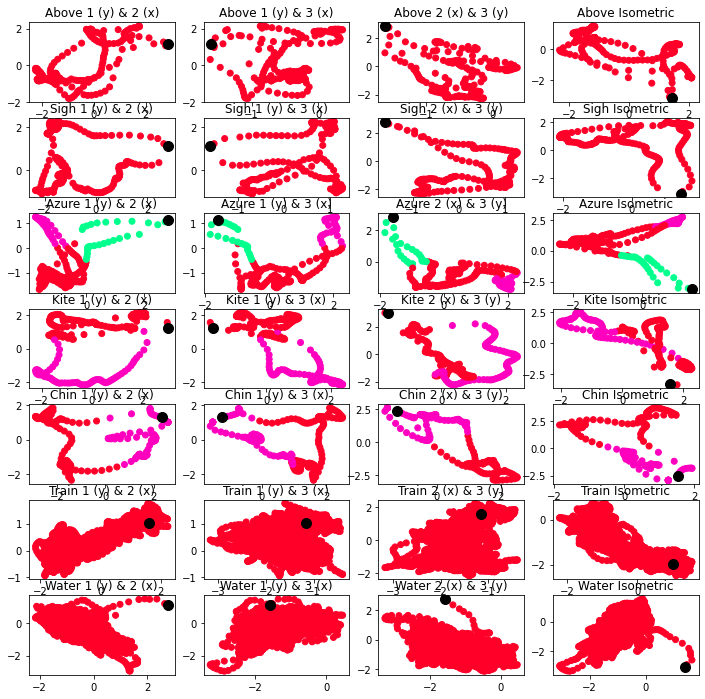

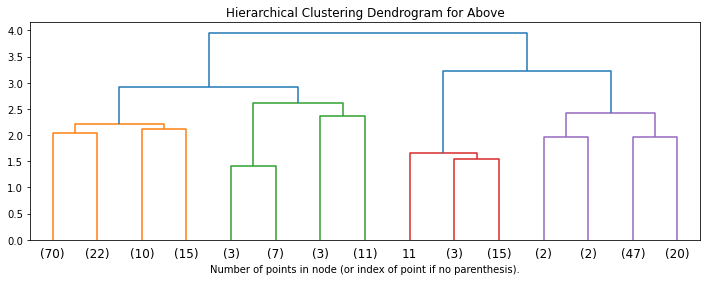

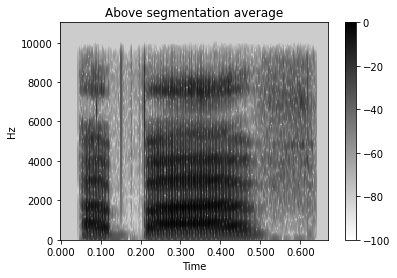

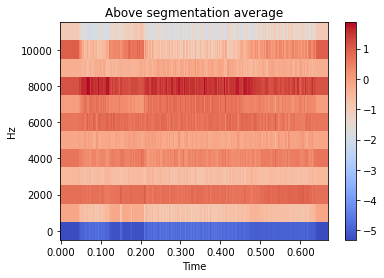

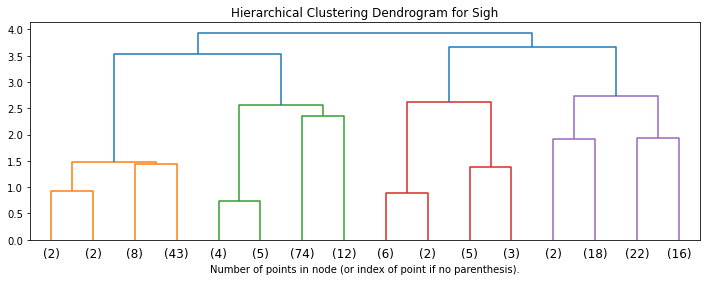

...

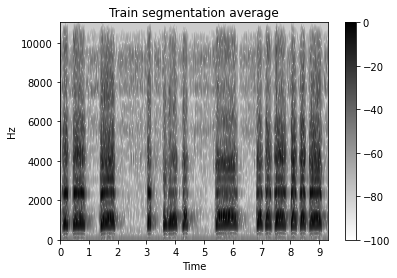

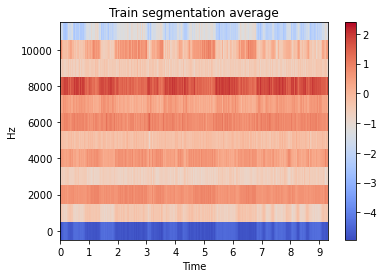

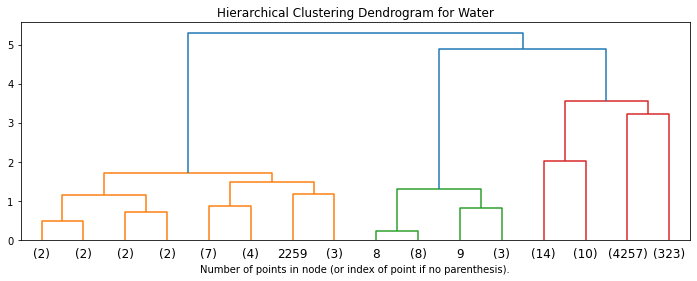

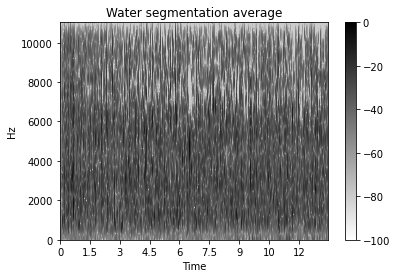

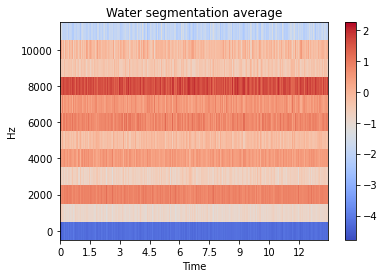

In [19]:
linkage = 'average'
distance_threshold = 4

colors = 'gist_rainbow'

data = [item for sublist in audio_data for item in sublist]

fig, axs = plt.subplots(nrows=7, ncols=4, figsize=(12, 12))

plt_dict = {}

for i,word in enumerate(['Above', 'Sigh', 'Azure', 'Kite', 'Chin', 'Train', 'Water']):
    clip = clip_dict[word]
    X,X_pca = clip["frames"],clip["pca"]

    word_data = next(item for item in data if item["fn"].split("/")[-1].split(".")[0].title() == word)

    if word in ["Train","Water"]:
        distance_threshold = 10

    agg_clusters_clip = AgglomerativeClustering(linkage = linkage, distance_threshold = distance_threshold, **common_params)

    y_pred = agg_clusters_clip.fit_predict(X)
    axs[i,0].scatter(X_pca[:, 1], X_pca[:, 0], c=y_pred, cmap = colors)
    axs[i,0].set_title(f"{word} 1 (y) & 2 (x)")
    axs[i,0].plot(X_pca[:, 1], X_pca[:, 0], 'o', ls='', ms=10, markevery=[0], color='black')

    axs[i,1].scatter(X_pca[:, 2], X_pca[:, 0], c=y_pred, cmap = colors)
    axs[i,1].set_title(f"{word} 1 (y) & 3 (x)")
    axs[i,1].plot(X_pca[:, 2], X_pca[:, 0], 'o', ls='', ms=10, markevery=[0], color='black')

    axs[i,2].scatter(X_pca[:, 2], X_pca[:, 1], c=y_pred, cmap = colors)
    axs[i,2].set_title(f"{word} 2 (x) & 3 (y)")
    axs[i,2].plot(X_pca[:, 2], X_pca[:, 1], 'o', ls='', ms=10, markevery=[0], color='black')

    axs[i,3].scatter(0.408*(2*X_pca[:, 0]+X_pca[:, 1]+X_pca[:, 2]), 0.707*(X_pca[:, 2]-X_pca[:, 1]), c=y_pred, cmap = colors)
    axs[i,3].set_title(f"{word} Isometric")
    axs[i,3].plot(0.408*(2*X_pca[:, 0]+X_pca[:, 1]+X_pca[:, 2]), 0.707*(X_pca[:, 2]-X_pca[:, 1]), 'o', ls='', ms=10, markevery=[0], color='black')

    plt.figure(figsize=(12,4))
    plt.title(f"Hierarchical Clustering Dendrogram for {word}")
    # plot the top three levels of the dendrogram
    plot_dendrogram(agg_clusters_clip, truncate_mode="level",p=3)
    plt.xlabel("Number of points in node (or index of point if no parenthesis).")

    plot_timeseries_on_spectrogram(word_data["fourier"],y_pred,sr,scale_ts=1,title=f"{word} segmentation {linkage}",line_color='red')
    plot_timeseries_on_mfcc(norm_array_hor(word_data["mfcc"]["12"],narr_scaler),y_pred,sr,scale_ts=1,title=f"{word} segmentation {linkage}",line_color='black')


##### Single Linkage
Uses the minimum of the distances between all observations of the two sets.

/Users/luntzlara/Library/CloudStorage/OneDrive-UBC/Grad_School/QP1/Acoustic Segments/audio_display.py:56: RuntimeWarning: invalid value encountered in true_divide
  ax.plot(times, data*scale_ts*10000/data_max, color=line_color)
/Users/luntzlara/Library/CloudStorage/OneDrive-UBC/Grad_School/QP1/Acoustic Segments/audio_display.py:69: RuntimeWarning: invalid value encountered in true_divide
  ax.plot(times, data*scale_ts*10000/data_max, color=line_color)
/Users/luntzlara/Library/CloudStorage/OneDrive-UBC/Grad_School/QP1/Acoustic Segments/audio_display.py:50: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()
/Users/luntzlara/Library/CloudStorage/OneDrive-UBC/Grad_School/QP1/Acoustic Segments/audio_display.py:56: RuntimeWarning: invalid value encoun

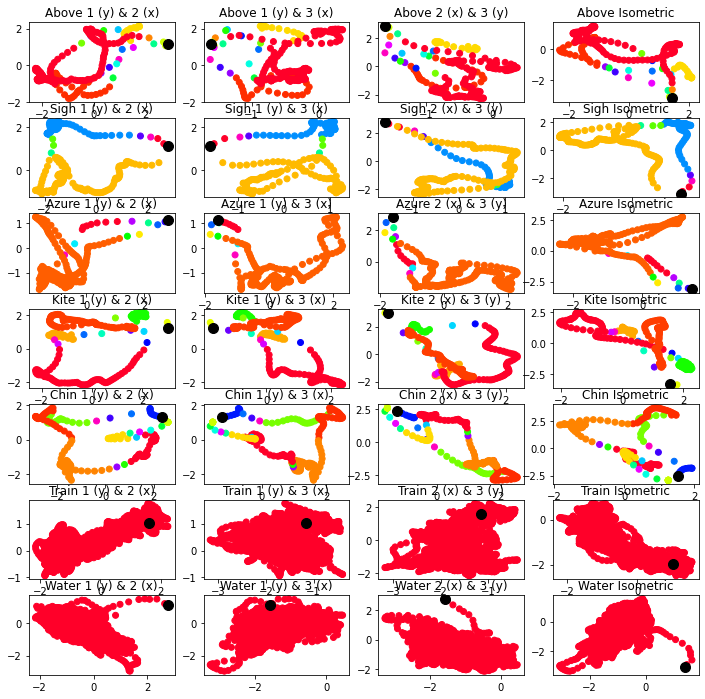

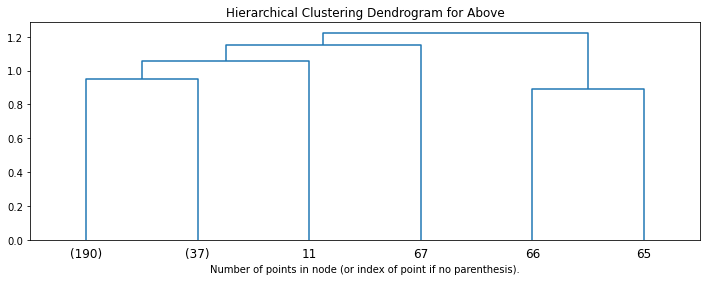

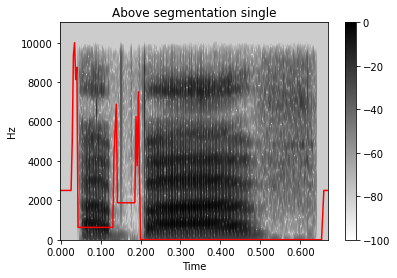

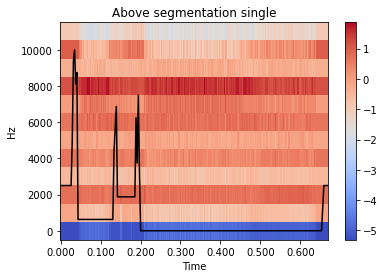

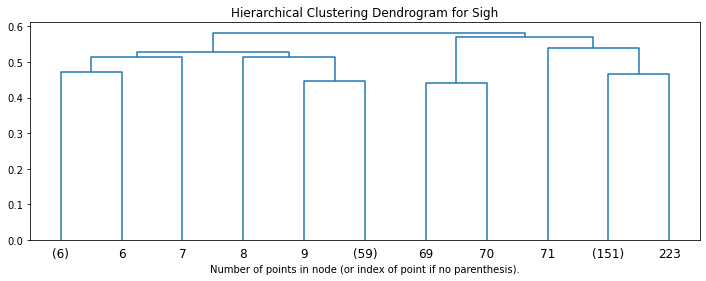

...

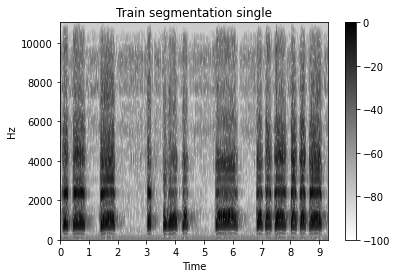

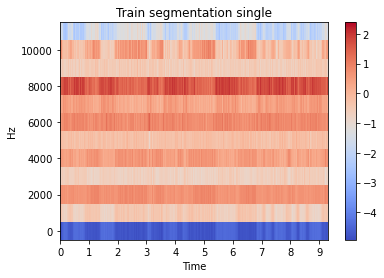

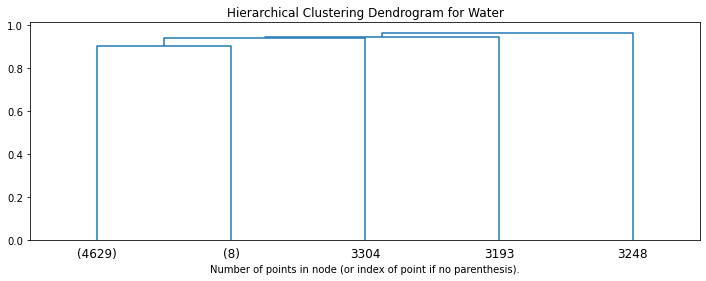

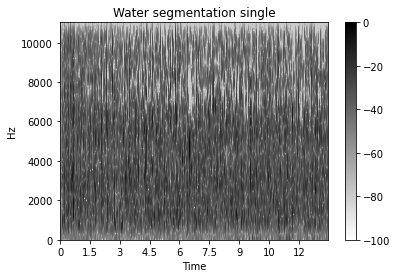

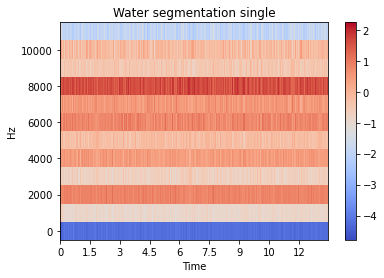

In [20]:
linkage = 'single'
distance_threshold = 0.5

colors = 'gist_rainbow'

data = [item for sublist in audio_data for item in sublist]

fig, axs = plt.subplots(nrows=7, ncols=4, figsize=(12, 12))

plt_dict = {}

for i,word in enumerate(['Above', 'Sigh', 'Azure', 'Kite', 'Chin', 'Train', 'Water']):
    clip = clip_dict[word]
    X,X_pca = clip["frames"],clip["pca"]

    word_data = next(item for item in data if item["fn"].split("/")[-1].split(".")[0].title() == word)

    if word == "Train":
        distance_threshold = 100
    
    if word == "Water":
        distance_threshold = 100

    agg_clusters_clip = AgglomerativeClustering(linkage = linkage, distance_threshold = distance_threshold, **common_params)

    y_pred = agg_clusters_clip.fit_predict(X)
    axs[i,0].scatter(X_pca[:, 1], X_pca[:, 0], c=y_pred, cmap = colors)
    axs[i,0].set_title(f"{word} 1 (y) & 2 (x)")
    axs[i,0].plot(X_pca[:, 1], X_pca[:, 0], 'o', ls='', ms=10, markevery=[0], color='black')

    axs[i,1].scatter(X_pca[:, 2], X_pca[:, 0], c=y_pred, cmap = colors)
    axs[i,1].set_title(f"{word} 1 (y) & 3 (x)")
    axs[i,1].plot(X_pca[:, 2], X_pca[:, 0], 'o', ls='', ms=10, markevery=[0], color='black')

    axs[i,2].scatter(X_pca[:, 2], X_pca[:, 1], c=y_pred, cmap = colors)
    axs[i,2].set_title(f"{word} 2 (x) & 3 (y)")
    axs[i,2].plot(X_pca[:, 2], X_pca[:, 1], 'o', ls='', ms=10, markevery=[0], color='black')

    axs[i,3].scatter(0.408*(2*X_pca[:, 0]+X_pca[:, 1]+X_pca[:, 2]), 0.707*(X_pca[:, 2]-X_pca[:, 1]), c=y_pred, cmap = colors)
    axs[i,3].set_title(f"{word} Isometric")
    axs[i,3].plot(0.408*(2*X_pca[:, 0]+X_pca[:, 1]+X_pca[:, 2]), 0.707*(X_pca[:, 2]-X_pca[:, 1]), 'o', ls='', ms=10, markevery=[0], color='black')

    plt.figure(figsize=(12,4))
    plt.title(f"Hierarchical Clustering Dendrogram for {word}")
    # plot the top three levels of the dendrogram
    plot_dendrogram(agg_clusters_clip, truncate_mode="level",p=3)
    plt.xlabel("Number of points in node (or index of point if no parenthesis).")

    plot_timeseries_on_spectrogram(word_data["fourier"],y_pred,sr,scale_ts=1,title=f"{word} segmentation {linkage}",line_color='red')
    plot_timeseries_on_mfcc(norm_array_hor(word_data["mfcc"]["12"],narr_scaler),y_pred,sr,scale_ts=1,title=f"{word} segmentation {linkage}",line_color='black')


#### n-Cluster Selection Using Silhouette Scores

For n_clusters = 2 The average silhouette_score is : 0.4747611
For n_clusters = 3 The average silhouette_score is : 0.4648875
For n_clusters = 4 The average silhouette_score is : 0.37621397
For n_clusters = 5 The average silhouette_score is : 0.36057222
For n_clusters = 6 The average silhouette_score is : 0.3763256
For n_clusters = 7 The average silhouette_score is : 0.38600335
For n_clusters = 8 The average silhouette_score is : 0.414551
For n_clusters = 9 The average silhouette_score is : 0.4424596
For n_clusters = 10 The average silhouette_score is : 0.4460724
For n_clusters = 11 The average silhouette_score is : 0.45688727
For n_clusters = 12 The average silhouette_score is : 0.44622546
For n_clusters = 13 The average silhouette_score is : 0.45186773
For n_clusters = 14 The average silhouette_score is : 0.45653757
For n_clusters = 15 The average silhouette_score is : 0.42988837


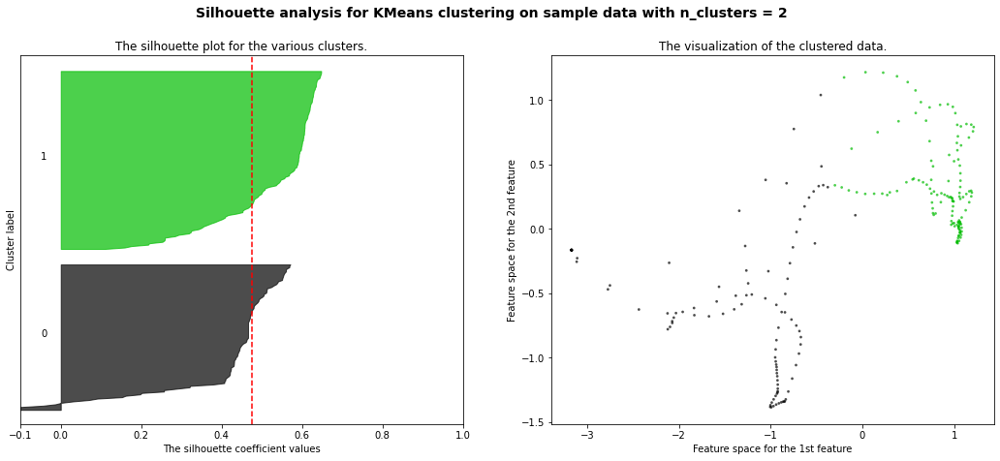

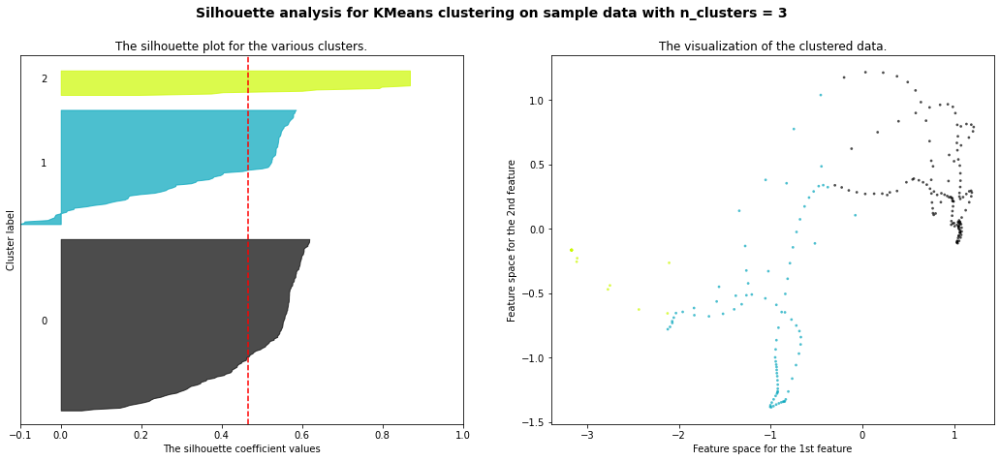

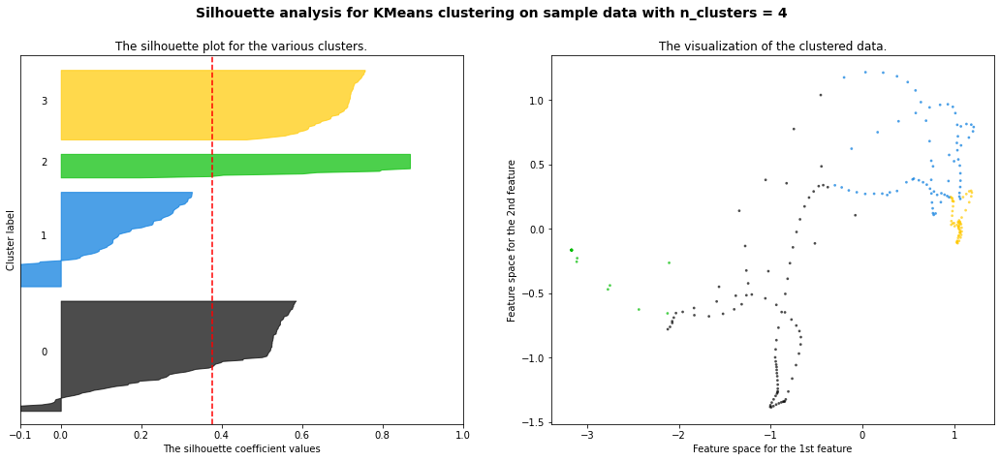

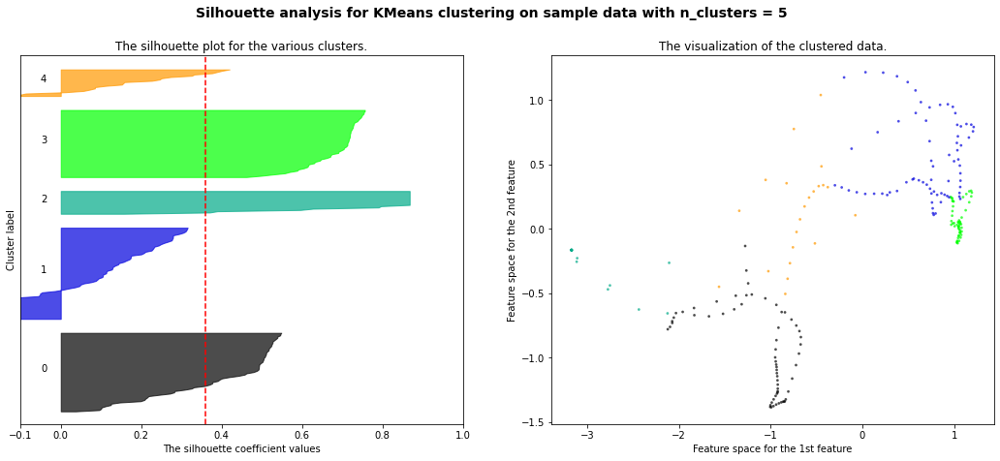

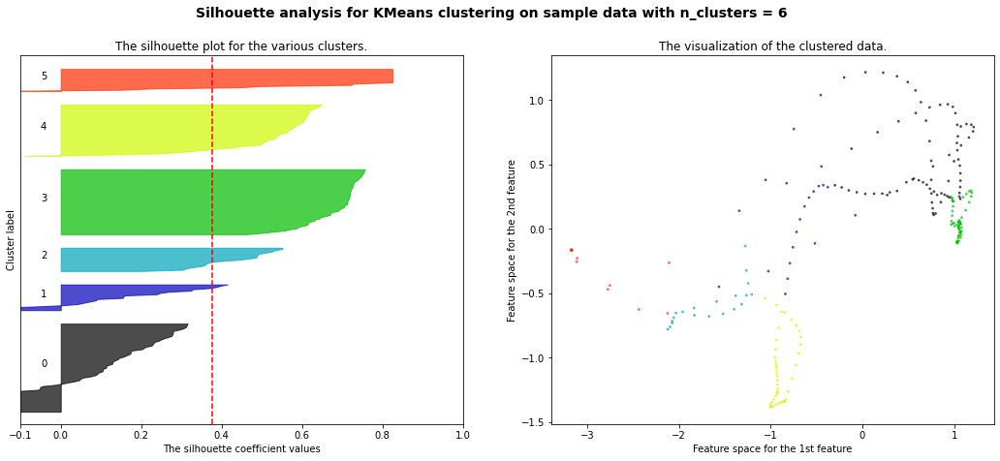

...

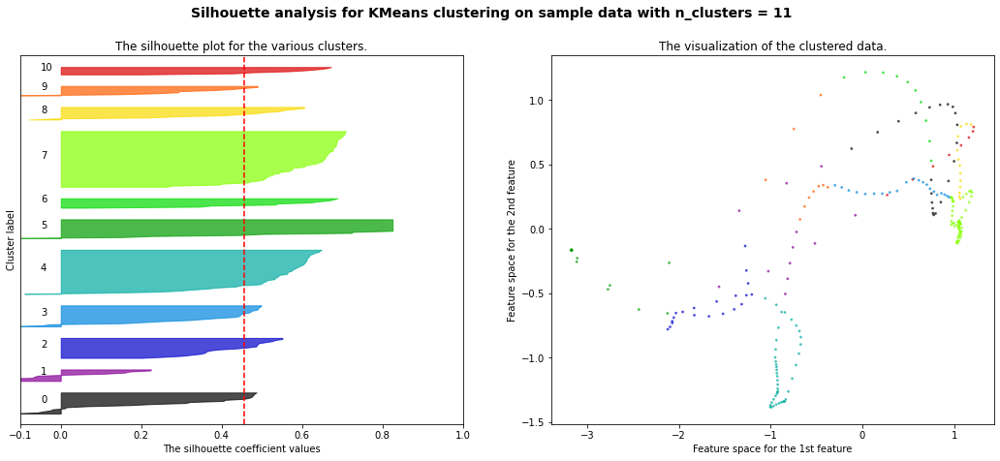

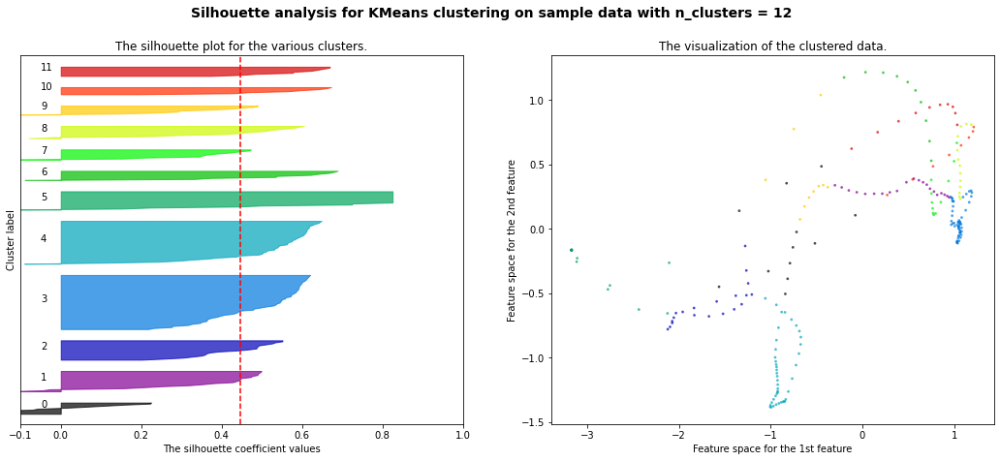

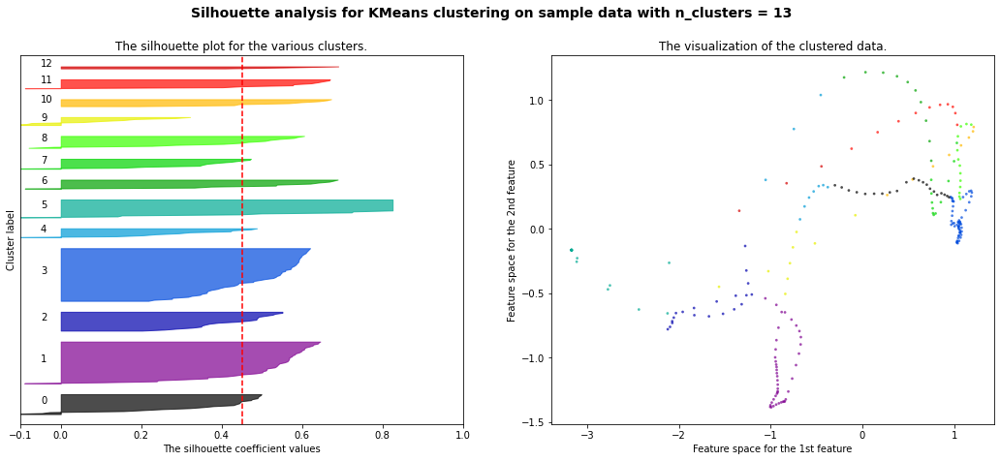

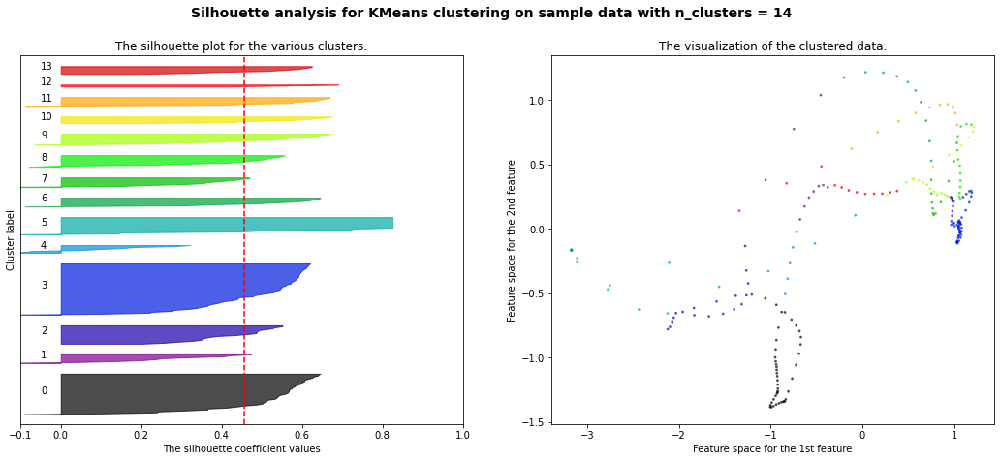

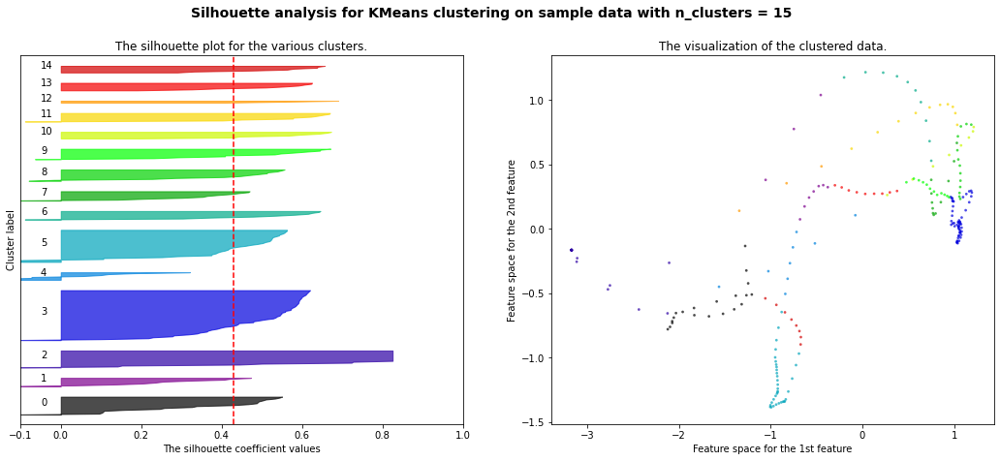

In [21]:
word = "Above"

clip = clip_dict[word]
X,X_pca = clip["frames"],clip["pca"]

range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = AgglomerativeClustering(linkage = "ward",n_clusters=n_clusters)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        X[:, 0], X[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    #centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    #ax2.scatter(
    #    centers[:, 0],
    #    centers[:, 1],
    #    marker="o",
    #    c="white",
    #    alpha=1,
    #    s=200,
    #    edgecolor="k",
    #)

    #for i, c in enumerate(centers):
    #    ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

For n_clusters = 2 The average silhouette_score is : 0.41096824
For n_clusters = 3 The average silhouette_score is : 0.43501464
For n_clusters = 4 The average silhouette_score is : 0.46322545
For n_clusters = 5 The average silhouette_score is : 0.39116263
For n_clusters = 6 The average silhouette_score is : 0.39167514
For n_clusters = 7 The average silhouette_score is : 0.40810293
For n_clusters = 8 The average silhouette_score is : 0.45139825
For n_clusters = 9 The average silhouette_score is : 0.4687512
For n_clusters = 10 The average silhouette_score is : 0.48201478
For n_clusters = 11 The average silhouette_score is : 0.47615072
For n_clusters = 12 The average silhouette_score is : 0.47437117
For n_clusters = 13 The average silhouette_score is : 0.46992388
For n_clusters = 14 The average silhouette_score is : 0.46708575
For n_clusters = 15 The average silhouette_score is : 0.46873894


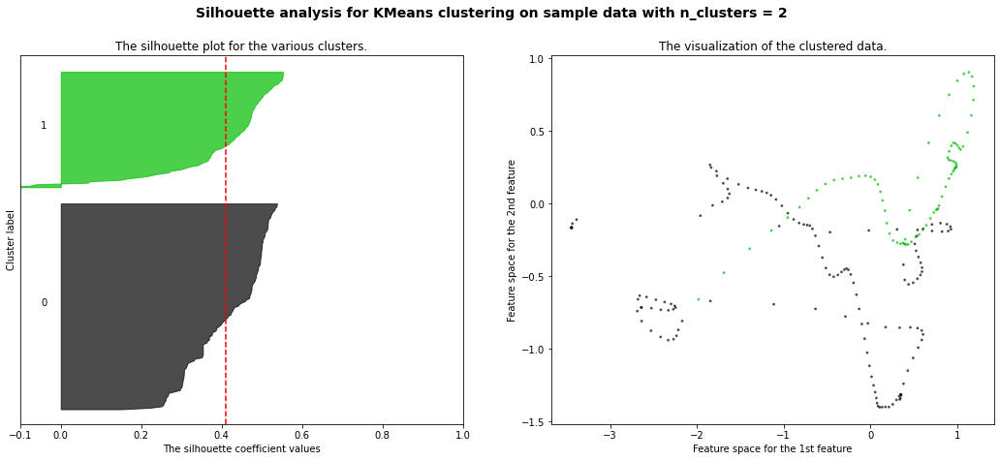

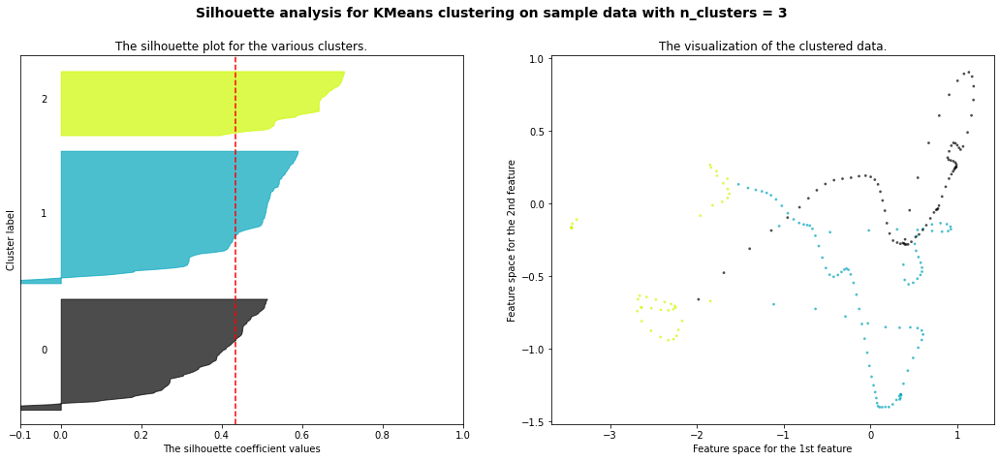

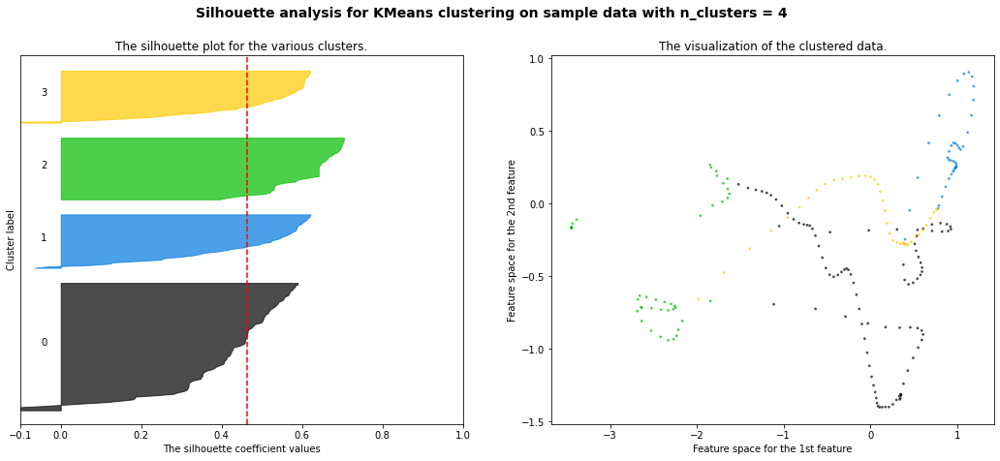

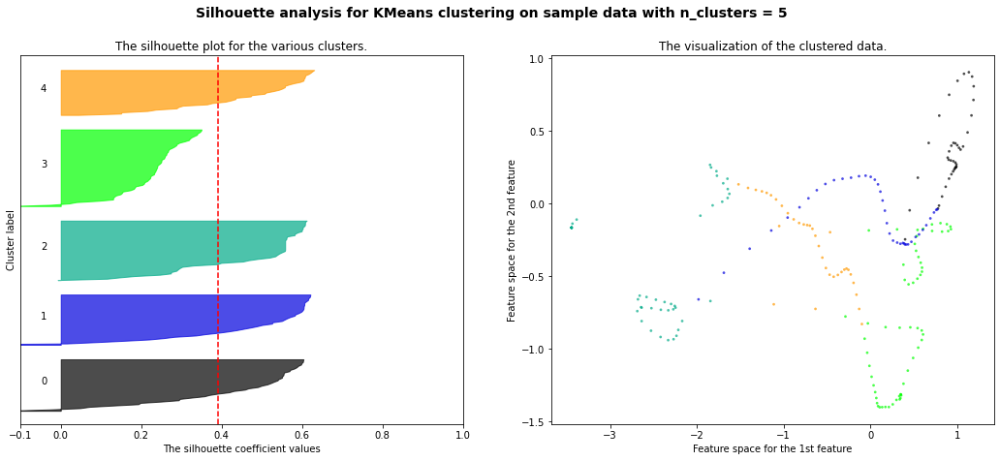

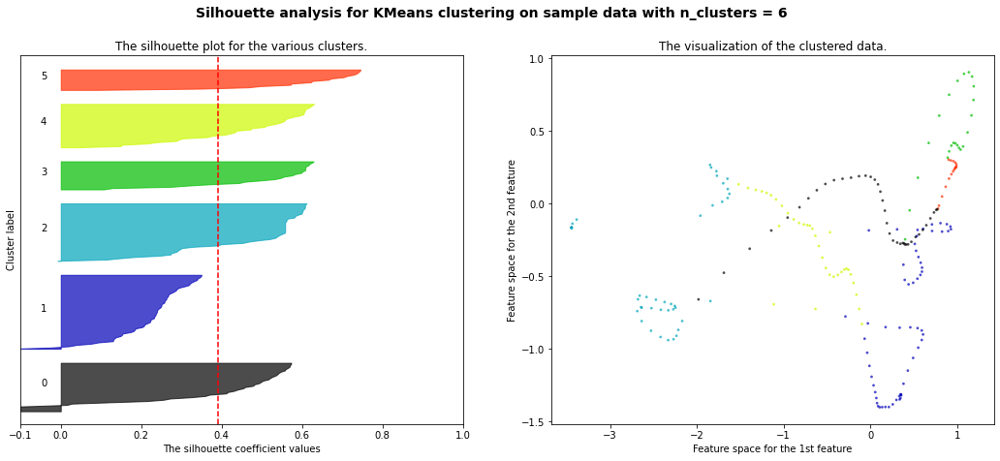

...

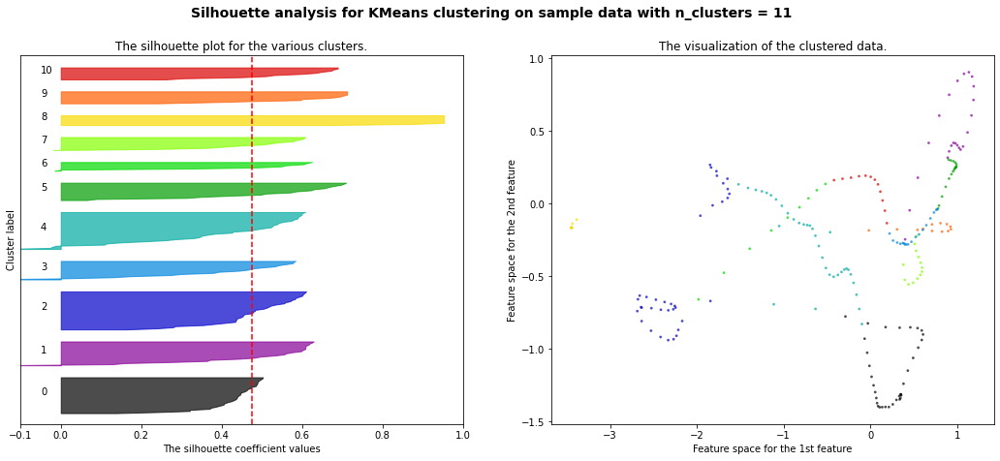

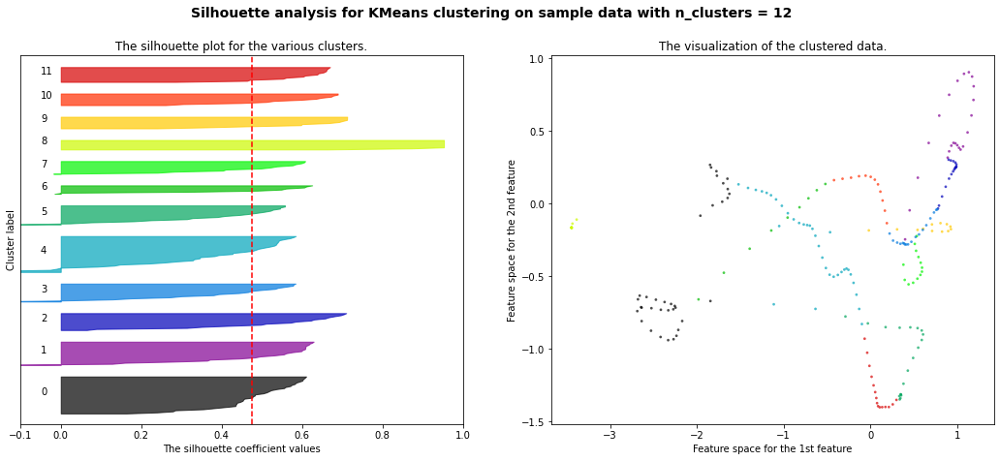

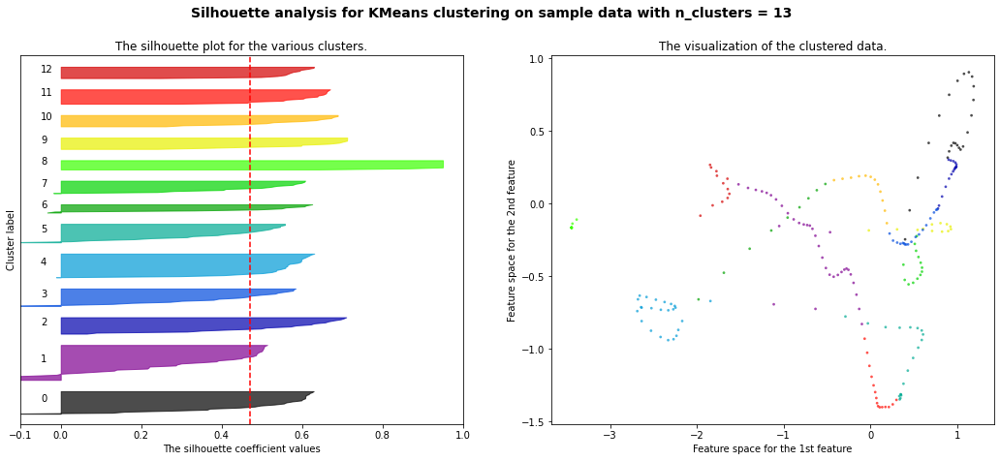

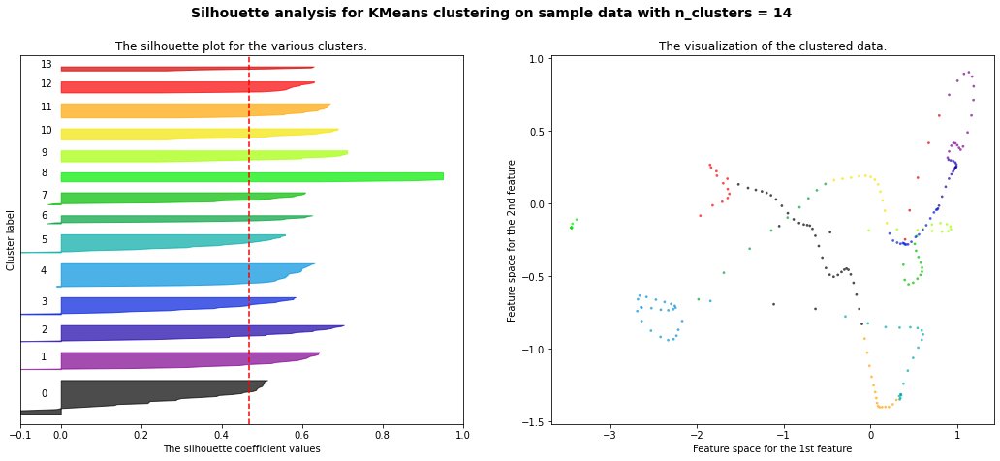

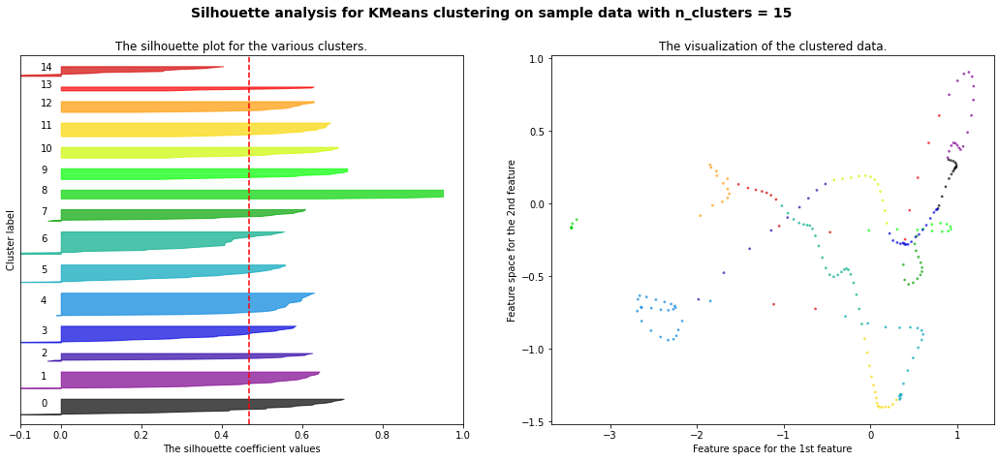

In [22]:
word = "Kite"

clip = clip_dict[word]
X,X_pca = clip["frames"],clip["pca"]

range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = AgglomerativeClustering(linkage = "ward",n_clusters=n_clusters)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        X[:, 0], X[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    #centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    #ax2.scatter(
    #    centers[:, 0],
    #    centers[:, 1],
    #    marker="o",
    #    c="white",
    #    alpha=1,
    #    s=200,
    #    edgecolor="k",
    #)

    #for i, c in enumerate(centers):
    #    ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

For n_clusters = 2 The average silhouette_score is : 0.40812007
For n_clusters = 3 The average silhouette_score is : 0.3909501
For n_clusters = 4 The average silhouette_score is : 0.3422342
For n_clusters = 5 The average silhouette_score is : 0.28936213
For n_clusters = 6 The average silhouette_score is : 0.2878115
For n_clusters = 7 The average silhouette_score is : 0.2496958
For n_clusters = 8 The average silhouette_score is : 0.25319657
For n_clusters = 9 The average silhouette_score is : 0.24941395
For n_clusters = 10 The average silhouette_score is : 0.2549046
For n_clusters = 11 The average silhouette_score is : 0.25352073
For n_clusters = 12 The average silhouette_score is : 0.2583255
For n_clusters = 13 The average silhouette_score is : 0.22312158
For n_clusters = 14 The average silhouette_score is : 0.22731115
For n_clusters = 15 The average silhouette_score is : 0.21653555


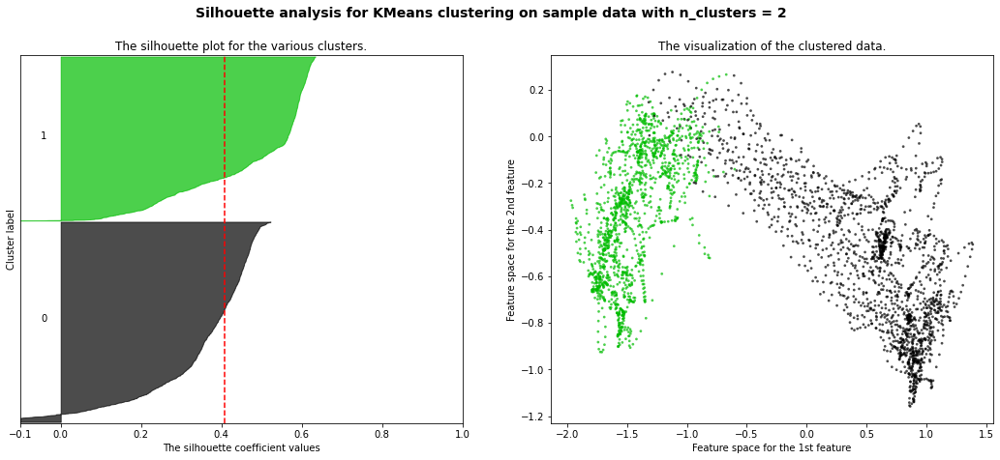

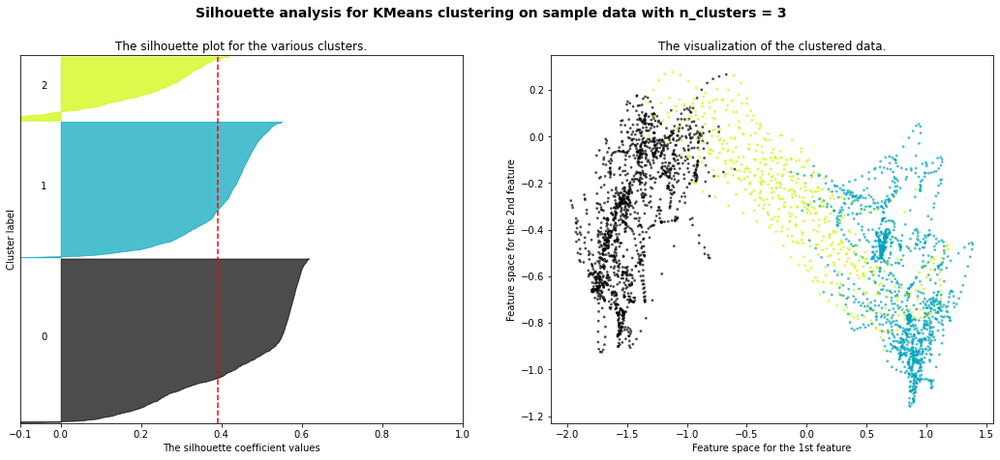

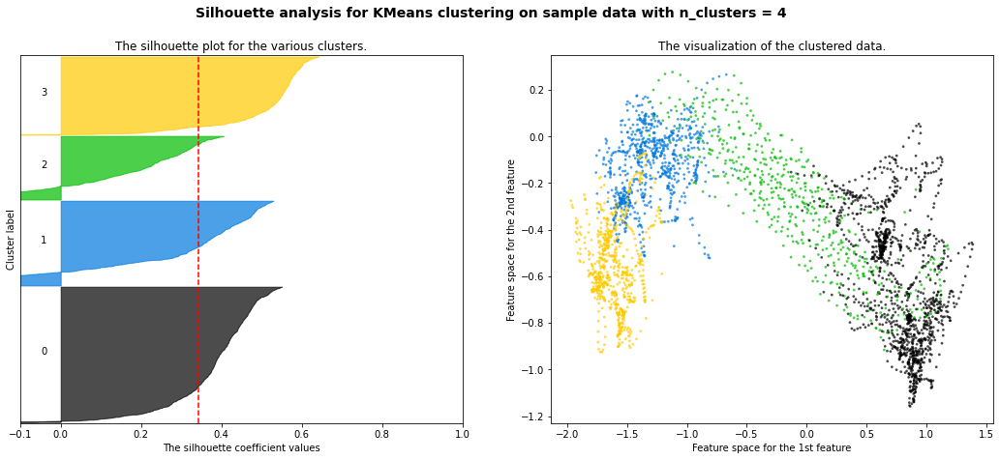

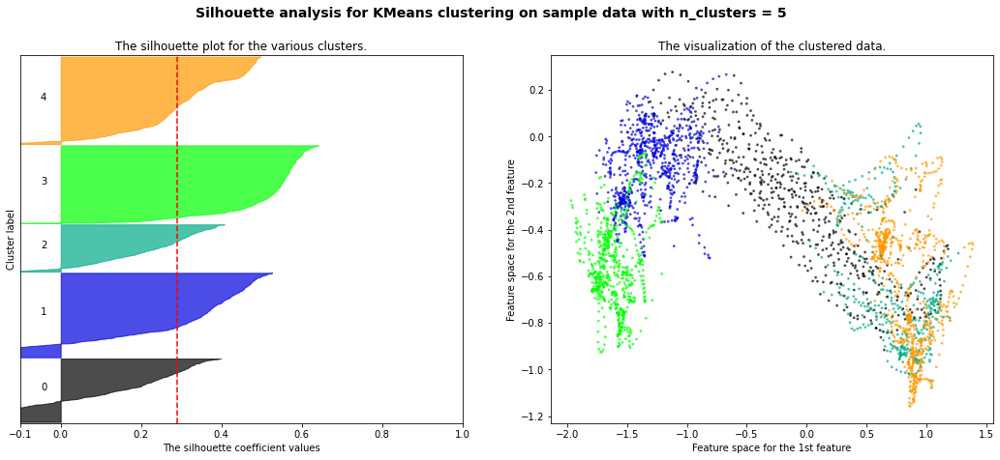

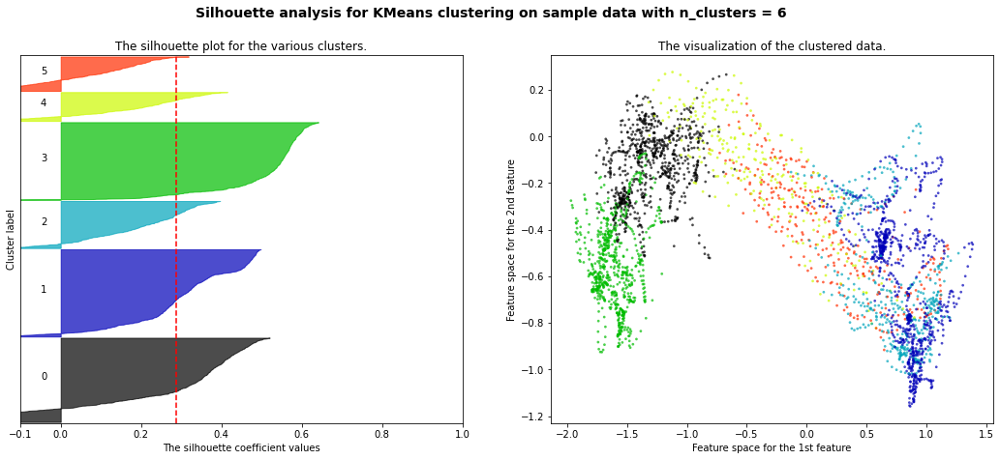

...

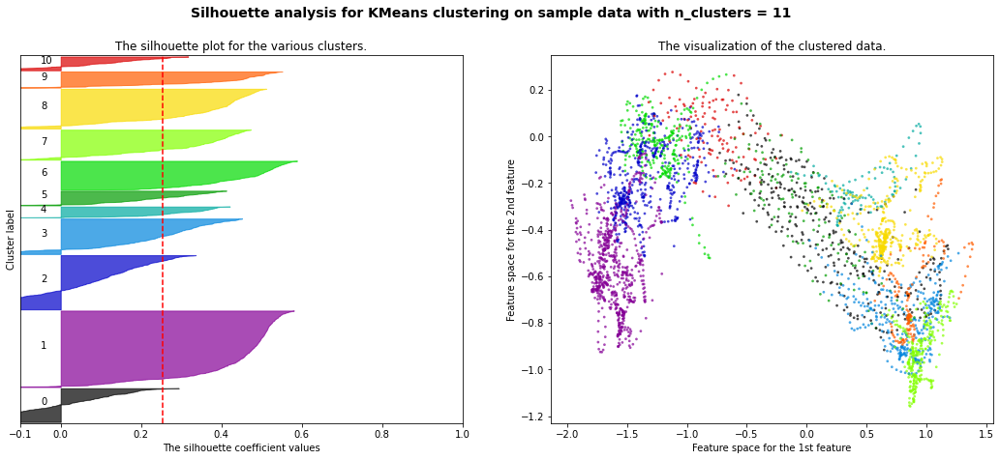

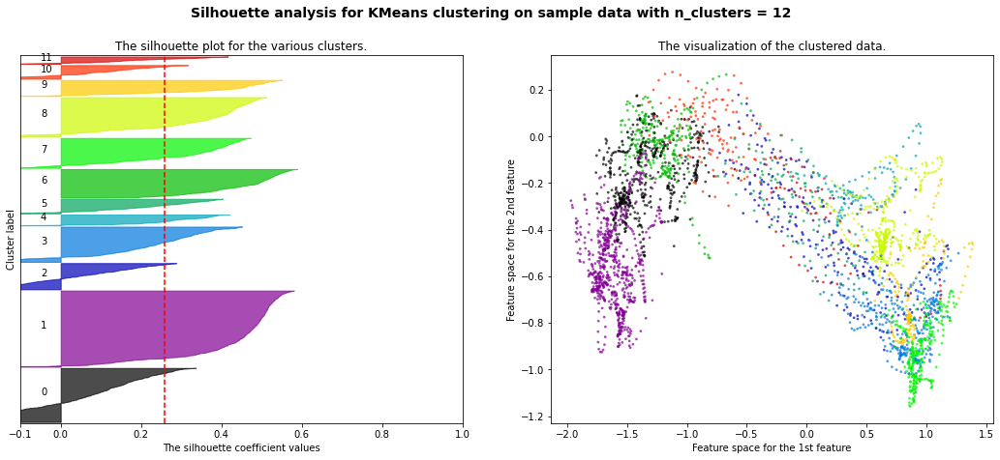

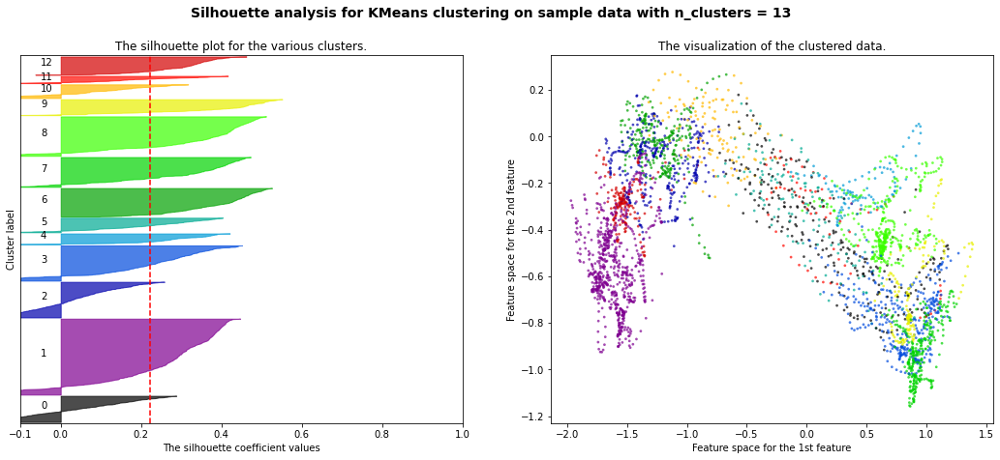

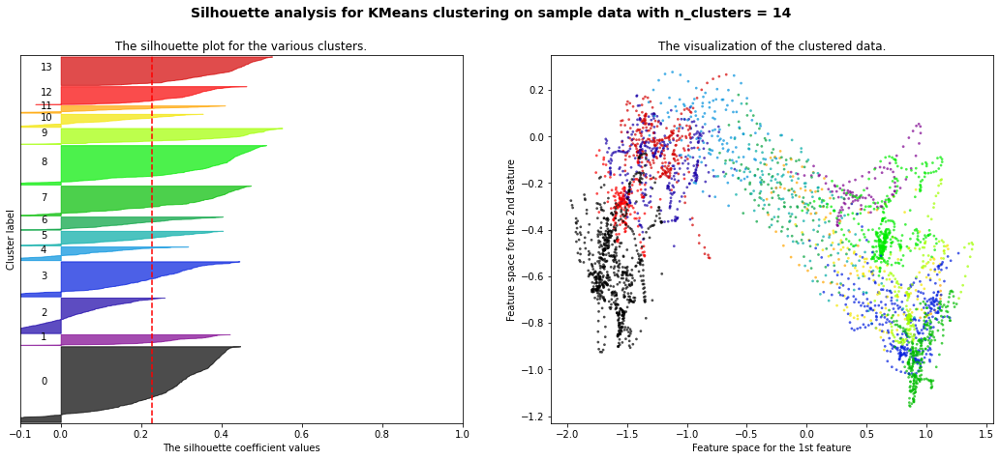

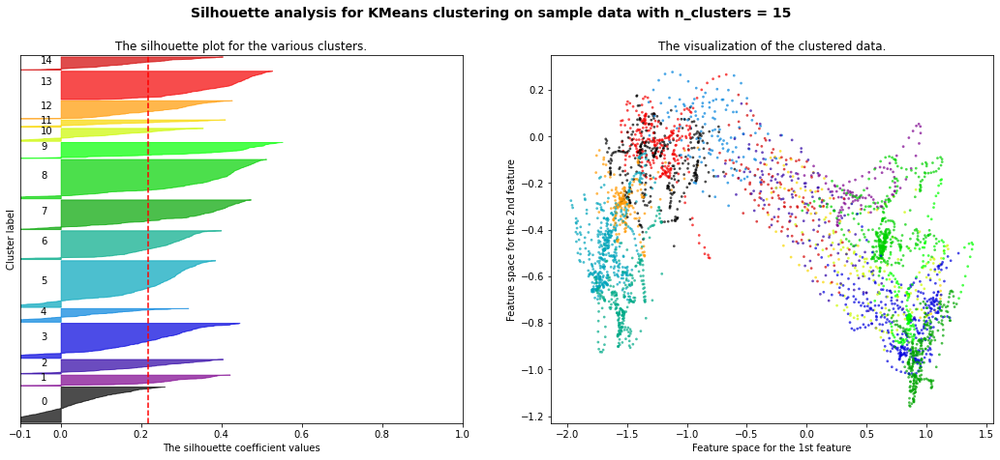

In [23]:
word = "Train"

clip = clip_dict[word]
X,X_pca = clip["frames"],clip["pca"]

range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = AgglomerativeClustering(linkage = "ward",n_clusters=n_clusters)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        X[:, 0], X[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    #centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    #ax2.scatter(
    #    centers[:, 0],
    #    centers[:, 1],
    #    marker="o",
    #    c="white",
    #    alpha=1,
    #    s=200,
    #    edgecolor="k",
    #)

    #for i, c in enumerate(centers):
    #    ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()